In [49]:
import seaborn as sns
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.lines import Line2D
import math
from itertools import product
from collections import defaultdict, Counter
from scipy.special import logsumexp
from matplotlib.colors import LinearSegmentedColormap

### for barplots priors

In [3]:
class Language:
    def __init__(self, signal_space):

        self.signal_space = signal_space

        self.length = len(self.signal_space)
        self.signals = [''.join(comb) for comb in product(signal_space, repeat=len(signal_space))]

        self.symbol_sets = [list(range(i * self.length, (i + 1) * self.length)) for i in range(self.length)]
        self.meanings = ["".join(map(str, combination)) for combination in product(*self.symbol_sets)]

    def return_meanings(self):
        return self.meanings
    
    def return_signals(self):
        return self.signals
    
    def return_languages(self):
        languages = [[(self.meanings[0], s0), (self.meanings[1], s1), (self.meanings[2], s2), (self.meanings[3], s3)] 
             for s0 in self.signals for s1 in self.signals for s2 in self.signals for s3 in self.signals]
        return languages

def normalize_probs(probs):
    total = sum(probs) #calculates the summed probabilities
    normedprobs = []
    for p in probs:
        normedprobs.append(p / total) 
    return normedprobs

def normalize_logprobs(logprobs):
    logtotal = logsumexp(logprobs) #calculates the summed log probabilities
    normedlogs = []
    for logp in logprobs:
        normedlogs.append(logp - logtotal) #normalise
    return normedlogs


In [5]:
def type_of_language(language):
    # hard coded for small meaning space
    words = []
    for meaning, signal in language:
        words.append(signal) 
    if len(set(words)) == 1:
        return 'degenerate'
    if len(set(words)) == 4 and ((words[0][0] == words[1][0] and words[2][0] == words[3][0] and words[0][1] == words[2][1] and words[1][1] == words[3][1]) or
     (words[0][1] == words[1][1] and words[2][1] == words[3][1] and words[0][0] == words[2][0] and words[1][0] == words[3][0])):
        return 'compositional'
    if len(set(words)) == 4:
        return 'holistic'
    return 'other'


def generate_grammar(language):
    """ 
    function to generate minimally redundant forms of languages
    hardcoded for the small signal meaning space.     
    """

    holistic_rules = defaultdict(list) # signal to (list of) meanings

    A1 = defaultdict(set); B1 = defaultdict(set)  # direct: m1->s1, m2->s2
    A2 = defaultdict(set); B2 = defaultdict(set)  # swapped: m1->s2, m2->s1

    for meaning, signal in language:
        holistic_rules[signal].append(meaning)
        if len(meaning) == 2 and len(signal) == 2:
            m1, m2 = meaning[0], meaning[1]
            s1, s2 = signal[0], signal[1]

            # orientation 1 (direct)
            A1[m1].add(s1)
            B1[m2].add(s2)

            # orientation 2 (swapped)
            A2[m1].add(s2)
            B2[m2].add(s1)
    

    # degenerate (single signal)
    if len(holistic_rules) == 1:
        return ".".join(f"S{','.join(holistic_rules[word])}{word}" for word in holistic_rules)

    def is_compositional(A, B):
        return all(len(v) == 1 for v in A.values()) and all(len(v) == 1 for v in B.values())

    
    if is_compositional(A1, B1):
        A_rules = ".".join(f"A{k}{''.join(v)}" for k, v in sorted(A1.items()))
        B_rules = ".".join(f"B{k}{''.join(v)}" for k, v in sorted(B1.items()))
        header = "SAB"
        return f"{header}.{A_rules}.{B_rules}"

    if is_compositional(A2, B2):
        A_rules = ".".join(f"A{k}{''.join(v)}" for k, v in sorted(A2.items()))
        B_rules = ".".join(f"B{k}{''.join(v)}" for k, v in sorted(B2.items()))
        header = "SBA"
        return f"{header}.{A_rules}.{B_rules}"

    # fallback: holistic listing
    return ".".join(f"S{','.join(sorted(holistic_rules[word]))}{word}" for word in holistic_rules)


def code_length(grammar: str) -> float:
    N = len(grammar)
    freqs = Counter(grammar)
    return sum(-math.log2(freqs[ch] / N) for ch in grammar)


def log_non_normed_prior(grammar: str, beta: float = 1.0):
    L_bits = code_length(grammar)
    return beta * -L_bits * math.log(2)


In [7]:
SIGNAL_SPACE = 'ab'
beta = 1.0
language = Language(SIGNAL_SPACE)
meanings = language.return_meanings()
signals = language.return_signals()
languages = language.return_languages()
types = [type_of_language(lang) for lang in languages]


    

In [9]:

gr_strings = [generate_grammar(lang) for lang in languages]
code_lengths = [code_length(gram) for gram in gr_strings]

In [10]:
priors_beta = []

betas = [0, 0.25, 0.5, 0.75, 1.0]

for beta in betas:
    priors_log = [log_non_normed_prior(g, beta) for g in gr_strings]
    priors_log_normed = normalize_logprobs(priors_log)
    priors_beta.append(priors_log_normed)

### Prior barplot

In [19]:
# print how many of each language type we have
for i in set(types):
    counter = 0
    for j in range(len(languages)):
        if types[j] == i:
            counter += 1
    print(counter, i)

228 other
8 compositional
4 degenerate
16 holistic


In [14]:
def log_to_normal_probability(logprob):
    normal_probs = []
    for p in logprob:
        normal_probability = math.exp(p)
        normal_probs.append(normal_probability)
    return normal_probs

In [21]:
def plot_priors_beta(log_priors, beta):

    prior = log_to_normal_probability(log_priors)

    df = pd.DataFrame(
        {'prior' : prior,
        'language type' : types}
    )


    sns.set(style='whitegrid')
    sns.barplot(x = 'language type', y ='prior', hue = 'language type',palette="Set1", data=df, estimator=sum, errorbar = None)
    
    
    plt.title(f"Prior per language type, beta = {beta}", fontsize=18)
    plt.xlabel("Language type", fontsize=12)
    plt.ylim(0,1)
    plt.ylabel("Prior probability", fontsize=12) 
    

    plt.savefig(f"priors_{beta}.pdf", dpi=300, bbox_inches="tight")
    plt.figure()


In [22]:
def plot_priors_init_rounds(log_priors, init_rounds):

    prior = log_to_normal_probability(log_priors)

    df = pd.DataFrame(
        {'prior' : prior,
        'language type' : types}
    )


    sns.set(style='whitegrid')
    sns.barplot(x = 'language type', y ='prior', hue = 'language type',palette="Set1", data=df, estimator=sum, errorbar = None)
    
    
    plt.title(f"Prior per language type, initial learning rounds = {init_rounds}", fontsize=18)
    plt.xlabel("Language type", fontsize=12)
    plt.ylim(0,1)
    plt.ylabel("Prior probability", fontsize=12) 
    

    plt.savefig(f"priors_{beta}.pdf", dpi=1000, bbox_inches="tight")
    plt.figure()


In [32]:

def plot_priors_grid(log_priors_list, beta_values, language_labels, filename="priors_grid.pdf"):

    # Hardcoded language types
    language_types = ['degenerate','holistic', 'compositional', 'other']
    
    # First four colors from Set1
    colors = sns.color_palette("Set1", n_colors=4)
    palette_dict = dict(zip(language_types, colors))

    n_plots = len(log_priors_list)
    n_rows, n_cols = 2, 3

    sns.set(style='whitegrid')
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 12))
    axes = axes.flatten()

    for i, (log_priors, beta) in enumerate(zip(log_priors_list, beta_values)):
        # Convert log-priors to probabilities
        prior = log_to_normal_probability(log_priors)
        df = pd.DataFrame({
            'prior': prior,
            'language type': language_labels
        })
        
        ax = axes[i]
        sns.barplot(
            x='language type',
            y='prior',
            hue='language type',
            palette=palette_dict,
            data=df,
            estimator=sum,
            errorbar=None,
            dodge=False,
            ax=ax
        )
        
        ax.set_title(f"beta = {beta}", fontsize=14)
        ax.set_ylim(0, 1)
        ax.set_xlabel('')
        ax.set_ylabel('Prior probability')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

        # Remove individual legends
        if ax.get_legend() != None:
            ax.get_legend().remove()

    # Turn off unused subplots
    for j in range(n_plots, n_rows * n_cols):
        axes[j].axis('off')

    # Add shared legend in the last empty subplot
    empty_ax = axes[-1]
    empty_ax.legend(
        handles=[plt.Rectangle((0,0),1,1,color=c) for c in colors],
        labels=language_types,
        loc='center',
        frameon=True
    )
    empty_ax.axis('off')

    fig.suptitle("Prior per language type", fontsize=18)
    plt.tight_layout(rect=[0, 0, 0.95, 0.96])
    plt.savefig(filename, dpi=1000, bbox_inches="tight")
    plt.show()


C:\Users\franc\AppData\Local\Temp\ipykernel_35704\3180862455.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\franc\AppData\Local\Temp\ipykernel_35704\3180862455.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\franc\AppData\Local\Temp\ipykernel_35704\3180862455.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
C:\Users\franc\AppData\Local\Temp\ipykernel_35704\3180862455.py:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xti

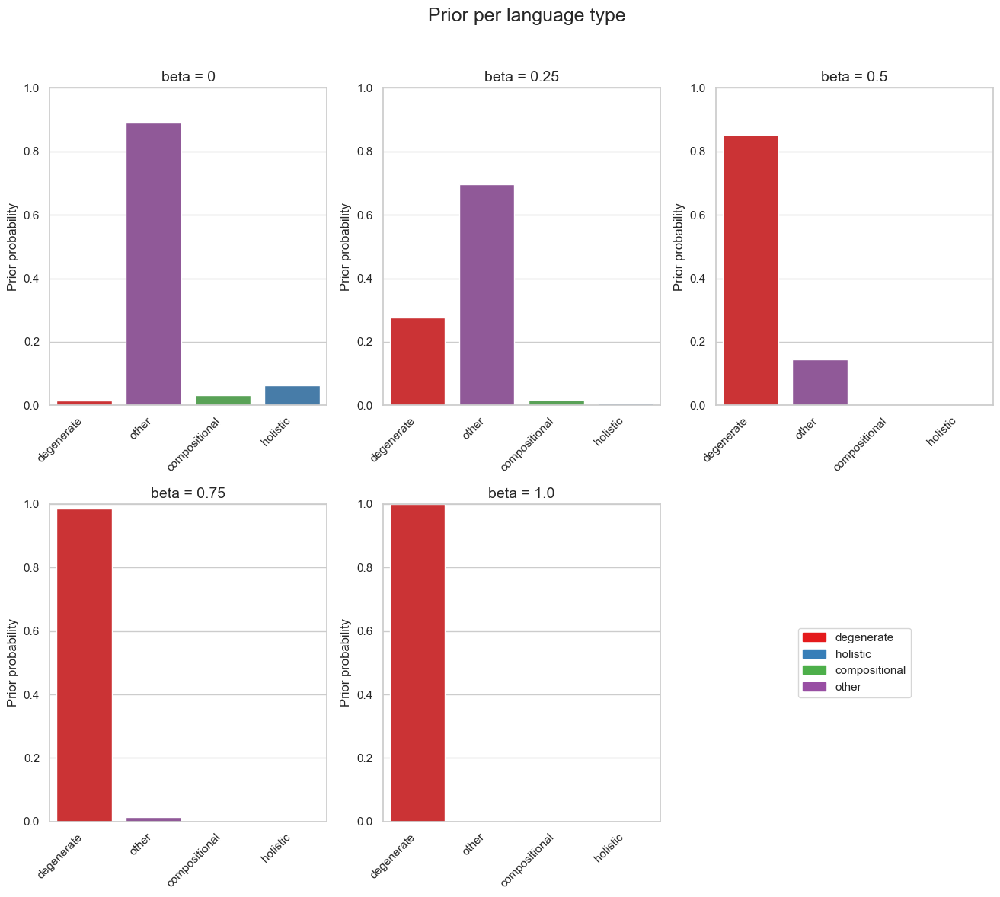

In [33]:
plot_priors_grid(priors_beta, betas, types)

In [39]:
def plot_priors_init_rounds_grid(log_priors_list, init_rounds_list, language_labels, filename="priors_init_rounds_grid.pdf"):

    language_types = ['degenerate','holistic', 'compositional', 'other']
    
    # Define consistent color palette
    colors = sns.color_palette("Set1", n_colors=4)
    
    palette_dict = dict(zip(language_types, colors))

    n_plots = len(log_priors_list)
    n_rows, n_cols = 1, 3  

    sns.set(style='whitegrid')
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 6))
    axes = axes.flatten()

    for i, (log_priors, init_rounds) in enumerate(zip(log_priors_list, init_rounds_list)):
        prior = log_to_normal_probability(log_priors)
        df = pd.DataFrame({
            'prior': prior,
            'language type': language_labels
        })

        ax = axes[i]
        sns.barplot(
            x='language type',
            y='prior',
            hue='language type',
            palette=palette_dict,
            data=df,
            estimator=sum,
            errorbar=None,
            dodge=False,
            ax=ax
        )

        ax.set_title(f"Initial learning rounds = {init_rounds}", fontsize=14)
        ax.set_ylim(0, 1)
        ax.set_xlabel('')
        ax.set_ylabel('Prior probability')
        ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right')

        # Remove per-subplot legends
        if ax.get_legend() is not None:
            ax.get_legend().remove()

    # Turn off unused subplots
    for j in range(n_plots, n_rows * n_cols):
        axes[j].axis('off')

   # Shared legend at the bottom
    fig.legend(
        handles=[plt.Rectangle((0, 0), 1, 1, color=c) for c in colors],
        labels=language_types,
        loc='lower center',
        bbox_to_anchor=(0.5, -0.03),
        ncol=len(language_types),
        frameon=True,
        fontsize=12
    )

    fig.suptitle("Prior per language type ", fontsize=18)
    plt.tight_layout(rect=[0, 0, 0.95, 0.96])
    plt.savefig(filename, dpi=300, bbox_inches="tight")
    plt.show()


In [40]:
def get_priors(log_priors, language_labels):
    # Convert log priors to probabilities
    max_log = np.max(log_priors)  # for numerical stability
    probs = np.exp(log_priors - max_log)
    prior = probs / np.sum(probs)  # normalize to sum to 1

    # Aggregate by language type
    df = pd.DataFrame({'prior': prior, 'language type': language_labels})
    df_summary = df.groupby('language type', as_index=False)['prior'].sum()

    return df_summary

In [41]:
get_priors(priors_beta[-1], types)

,language type,prior
0,compositional,1.938715e-06
1,degenerate,9.987714e-01
2,holistic,1.426784e-08
3,other,1.226692e-03


C:\Users\franc\AppData\Local\Temp\ipykernel_35704\1232014386.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right')
C:\Users\franc\AppData\Local\Temp\ipykernel_35704\1232014386.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right')
C:\Users\franc\AppData\Local\Temp\ipykernel_35704\1232014386.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=25, ha='right')


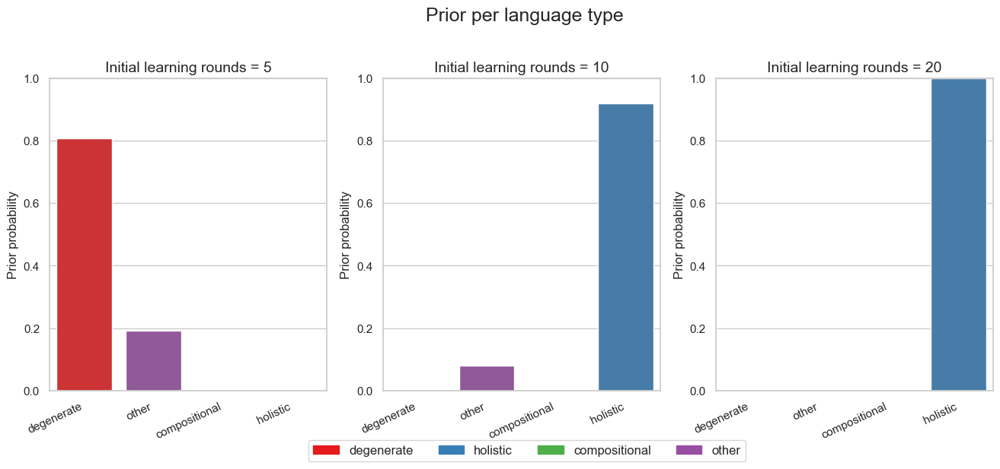

In [43]:
init_rounds = [5, 10, 20]

init_priors = []

for rounds in init_rounds:
    prior = np.load(f"Experiment_9/prior_{rounds}.npy")
    init_priors.append(prior)

plot_priors_init_rounds_grid(init_priors, init_rounds, types, "init_grid.pdf")

## Experiment 1

In [44]:
group_rounds = [0, 10, 20]
turnover_rounds = [0, 10, 20]
pop_sizes = [25]
n_runs = 50
modes = ["Sample", "MAP"] 
replaced = [False, True]

### Merging and saving big csv files

In [ ]:
for mode in modes:
    for replace in replaced:
        list_df = []
        for group_round in group_rounds:
            for turnover_round in turnover_rounds:
                for pop_size in pop_sizes:
                    if (group_round != 0 or turnover_round != 0):
                        name = f"h{group_round}_v{turnover_round}_p{pop_size}"
                        results_dir = f"Experiment_1/results_snellius/{mode}/{replace}/{name}"
                        for run in range(n_runs):
                            df = pd.read_csv(f"{results_dir}/run{run}.csv")
                            df["condition"] = f"{turnover_round} vertical transmission, {group_round} horizontal transmission"
                            list_df.append(df)

        save_dir = f"Experiment_1/plots/{mode}/{replace}"
        os.makedirs(save_dir, exist_ok=True)  
        big_df = pd.concat(list_df)
        big_df.to_csv(f"{save_dir}/{mode}.csv")

In [ ]:

def fast_plot_exp1(csv_path_replaced, csv_path_not_replaced, title, save_path):
    # Load both datasets
    df_replaced = pd.read_csv(f"{csv_path_replaced}.csv")
    df_not_replaced = pd.read_csv(f"{csv_path_not_replaced}.csv")

    # Define consistent color palette and order
    palette = [
        "#F0C77B", "#E69F00",  # Golden-orange (group 1)
        "#B4C9F0", "#56B4E9", "#0072B2",  # Blue-purple (group 2)
        "#B7E3CD", "#73D6B1", "#009E73"   # Teal-green (group 3)
    ]

    hue_order = [
        "0 vertical transmission, 10 horizontal transmission",
        "0 vertical transmission, 20 horizontal transmission", 
        "10 vertical transmission, 0 horizontal transmission", 
        "10 vertical transmission, 10 horizontal transmission",
        "10 vertical transmission, 20 horizontal transmission", 
        "20 vertical transmission, 0 horizontal transmission",
        "20 vertical transmission, 10 horizontal transmission", 
        "20 vertical transmission, 20 horizontal transmission"
    ]

    # Mapping conditions to colors
    condition_to_color = dict(zip(hue_order, palette))

    # calculate CI and return summary
    def compute_summary(df):
        grouped = df.groupby(['condition', 'generation'])['compositional']
        mean = grouped.mean()
        sem = grouped.sem()
        ci_hi = mean + 1.96 * sem
        ci_lo = mean - 1.96 * sem
        return pd.DataFrame({
            'mean': mean,
            'ci_lo': ci_lo,
            'ci_hi': ci_hi
        }).reset_index()

    summary_replaced = compute_summary(df_replaced)
    summary_not_replaced = compute_summary(df_not_replaced)

    # Setup subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

    def plot_summary(ax, summary, subtitle, show_ylabel=True):
        for condition in hue_order:
            cond_data = summary[summary['condition'] == condition]
            if cond_data.empty:
                continue
            ax.plot(cond_data['generation'], cond_data['mean'], label=condition, color=condition_to_color[condition], 
                    )
            ax.fill_between(cond_data['generation'], cond_data['ci_lo'], cond_data['ci_hi'],
                            alpha=0.05, color=condition_to_color[condition], rasterized=True)

        print(f"\nFinal compositionality levels for: {subtitle}")
        for condition in hue_order:
            cond_data = summary[summary['condition'] == condition]
            if cond_data.empty:
                continue
            final_gen = cond_data['generation'].max()
            final_row = cond_data[cond_data['generation'] == final_gen]
            if not final_row.empty:
                mean_val = final_row['mean'].values[0]
                ci_lo_val = final_row['ci_lo'].values[0]
                ci_hi_val = final_row['ci_hi'].values[0]
                print(f"  {condition}: {mean_val:.3f} (95% CI: {ci_lo_val:.3f} – {ci_hi_val:.3f})")

        ax.set_title(subtitle)
        ax.set_xlabel("Iteration")
        if show_ylabel:
            ax.set_ylabel("Proportion compositional")
        ax.grid(True)
        ax.tick_params(labelleft=True)
        if not cond_data.empty:
            ax.set_xlim(cond_data['generation'].min(), cond_data['generation'].max())


    # Plot both panels
    plot_summary(ax1, summary_replaced, "All agents replaced each iteration", show_ylabel=True)
    plot_summary(ax2, summary_not_replaced, "One agent replaced each iteration", show_ylabel=False)

        # Group the hue_order into color groups
    group1 = hue_order[0:2]  # Golden-orange
    group2 = hue_order[2:5]  # Blue-purple
    group3 = hue_order[5:8]  # Teal-green
    

    # Dummy line for spacing
    def dummy_line():
        return Line2D([], [], linestyle='none')  # Invisible, valid handle

    # Helper to generate legend handles/labels for a group
    def get_legend_items(group, target_len):
        handles = [Line2D([0], [0], color=condition_to_color[cond], lw=3) for cond in group]
        labels = group
        # Pad to match longest column
        while len(handles) < target_len:
            handles.append(dummy_line())
            labels.append("")
        return handles, labels

    # Compute max column height
    max_len = max(len(group1), len(group2), len(group3))

    # Get padded handles and labels
    handles1, labels1 = get_legend_items(group1, max_len)
    handles2, labels2 = get_legend_items(group2, max_len)
    handles3, labels3 = get_legend_items(group3, max_len)

    # Combine for legend
    flat_handles = handles1 + handles2 + handles3
    flat_labels = labels1 + labels2 + labels3

    # Add custom legend
    fig.legend(
        handles=flat_handles,
        labels=flat_labels,
        title="Condition",
        loc='lower center',
        ncol=3,  # One column per group
        fontsize='small',
        title_fontsize='medium',
        frameon=True,                      
        framealpha=1.0,                    
        edgecolor='grey', 
        columnspacing=1.5,
        handletextpad=0.5,
        bbox_to_anchor=(0.5, -0.18)
    )

    fig.suptitle(title, fontsize=20)
    fig.tight_layout(rect=[0, 0.01, 1, 0.93])  # Adjust for legend space
    plt.savefig(f"{save_path}_1.pdf", bbox_inches='tight', pad_inches=0.05)
    plt.show()
    plt.clf()


In [ ]:
for mode in modes:
    csv_path1 = f"Experiment_1/plots/{mode}/True/{mode}"
    csv_path2 = f"Experiment_1/plots/{mode}/False/{mode}"
        
    title = f"Proportion Compositional - Horizontal and Vertical Transmission - Mode: {mode}"
    fast_plot_exp1(csv_path1, csv_path2, title, save_path=f"Experiment_1/plots/{mode}")


In [53]:
def plot_each_language_type_ax(ax, results, title):
    grouped = results.groupby("generation")[["degenerate", "holistic", "other", "compositional"]]
    
    # Compute mean, std, and n
    grouped_mean = grouped.mean()
    grouped_sem = grouped.sem()
    
    # Compute standard error and 95% CI using t-distribution
    ci95 = 1.96 * grouped_sem  

    colors = {
        "degenerate": "#d62728",    # red
        "holistic": "#1f77b4",      # blue
        "other": "#9467bd",         # purple
        "compositional": "#2ca02c"  # green
    }

    for col in grouped_mean.columns:
        mean = grouped_mean[col]
        ci = ci95[col]

        ax.plot(grouped_mean.index, mean, label=col, color=colors[col])
        ax.fill_between(grouped_mean.index, mean - ci, mean + ci, alpha=0.2, color=colors[col], rasterized=True)

    ax.set_ylim(0, 1)
    ax.set_title(title, fontsize=10)
    ax.grid(alpha=0.3)
    ax.tick_params(axis="both", which="both", labelsize=9)

def plot_grid(big_df, save_to, mode, replace, alpha):
    fig, axes = plt.subplots(3, 3, figsize=(15, 12))  # no sharex/sharey

    verticals = [20, 10, 0]      # top → bottom
    horizontals = [0, 10, 20]    # left → right

    for i, v in enumerate(verticals):
        for j, h in enumerate(horizontals):
            ax = axes[i, j]

            # skip bottom-left corner (v=0, h=0)
            if v == 0 and h == 0:
                ax.axis("off")

                # place legend here in 2x2 grid
                handles, labels = axes[0,1].get_legend_handles_labels()
                ax.legend(
                    handles, labels,
                    loc="center",
                    ncol=2,        # 2x2 grid
                    title="Type",
                    fontsize=10,
                    frameon=True
                )
                continue

            subset = big_df[
                (big_df["condition"] == f"{v} vertical transmission, {h} horizontal transmission")
            ]

            if not subset.empty:
                plot_each_language_type_ax(ax, subset, f"v={v}, h={h}")
            else:
                ax.axis("off")

            # axis labels on all subplots
            if v == 0:
                ax.set_xlabel("Iteration", fontsize=9)
            if h == 0 or (v==0 and h==10):
                ax.set_ylabel("Avg. Proportion", fontsize=9)

            # Limit x-axis to 0-10000
            ax.set_xlim(0, 10000)

    # Axis annotations
    fig.text(0.5, 0.01, "Horizontal Transmission →", ha="center", fontsize=13)
    fig.text(0.01, 0.5, "Vertical Transmission →", va="center", rotation="vertical", fontsize=13)

    # Title at the top
    replace_str = "Entire Population" if replace else "1 Agent per iteration"
    if alpha == 0:
        fig.suptitle(f"Proportion per language type - Mode: {mode} - Replacement: {replace_str}", fontsize=14, y=0.95)
    else:
        fig.suptitle(f"Proportion per language type - Alpha: {alpha} - Mode: {mode} - Replacement: {replace_str}", fontsize=14, y=0.95)


    plt.tight_layout(rect=[0.05, 0.05, 1, 0.93])  # adjust to keep title
    plt.savefig(f"{save_to}_{mode}.pdf", bbox_inches="tight", pad_inches=0.05)
    plt.show()


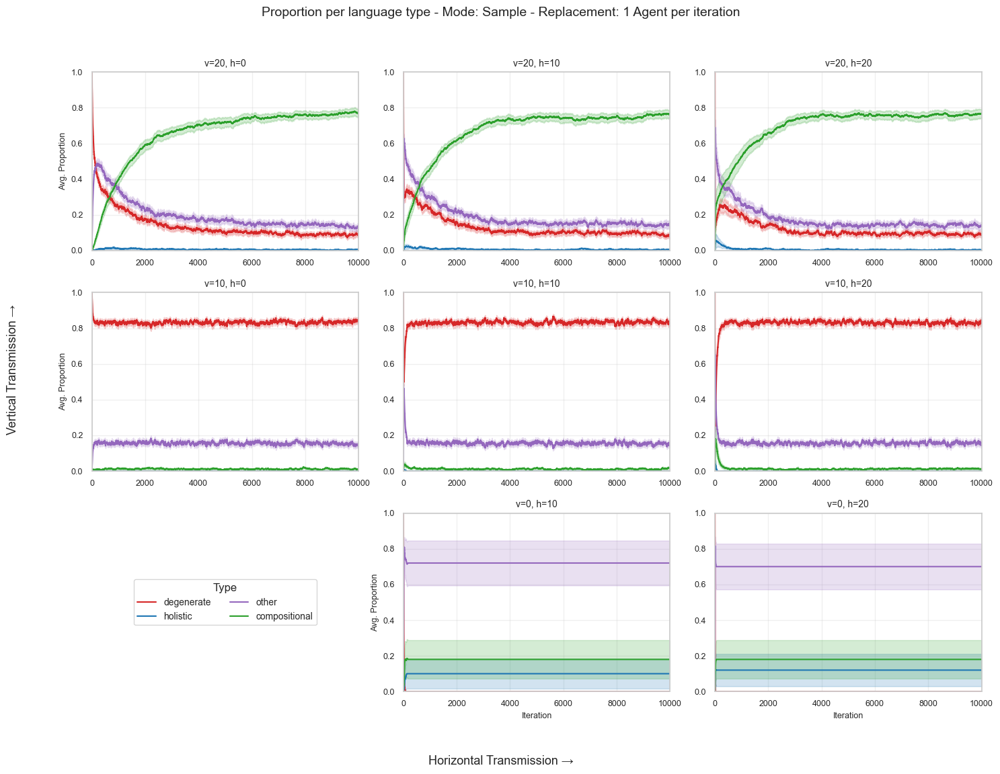

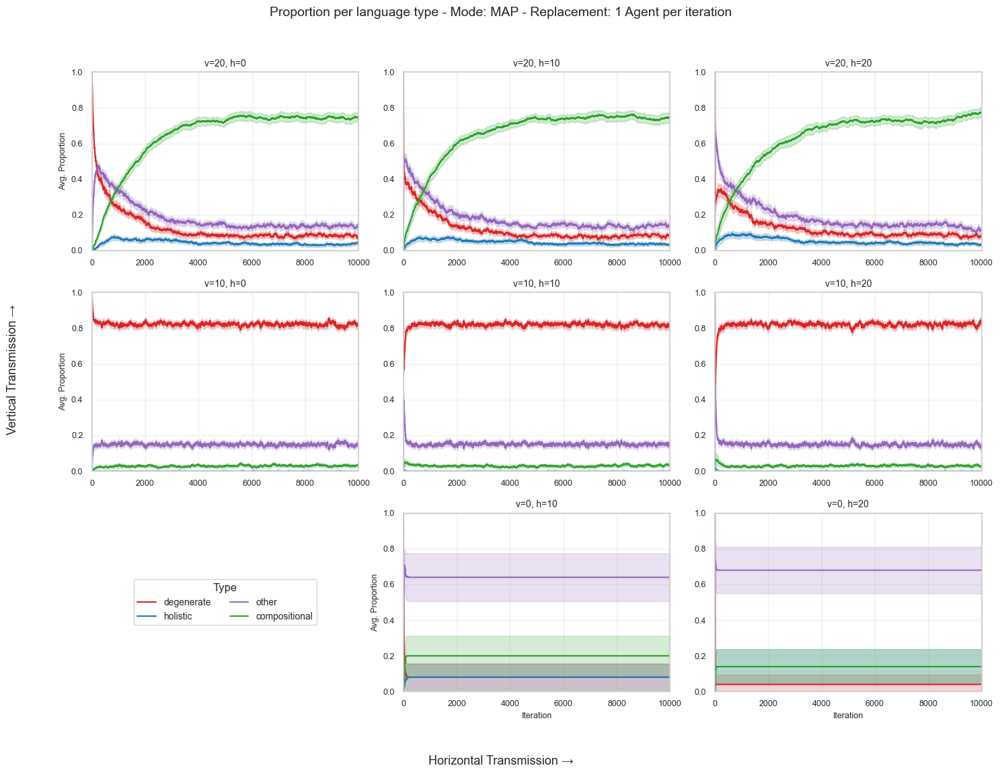

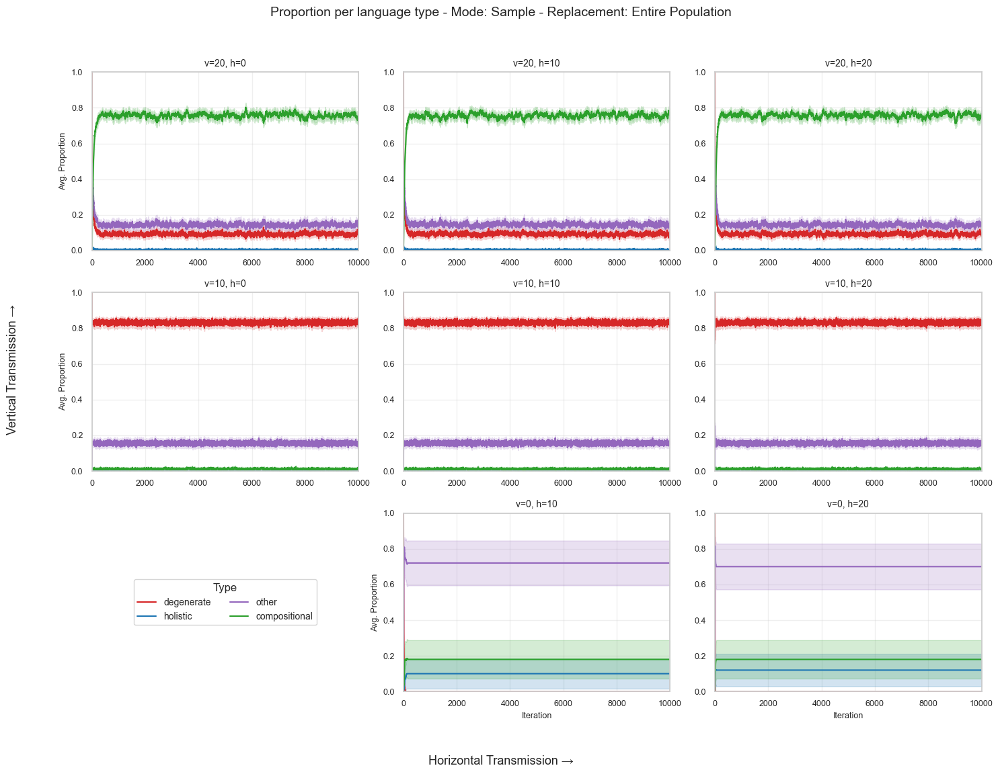

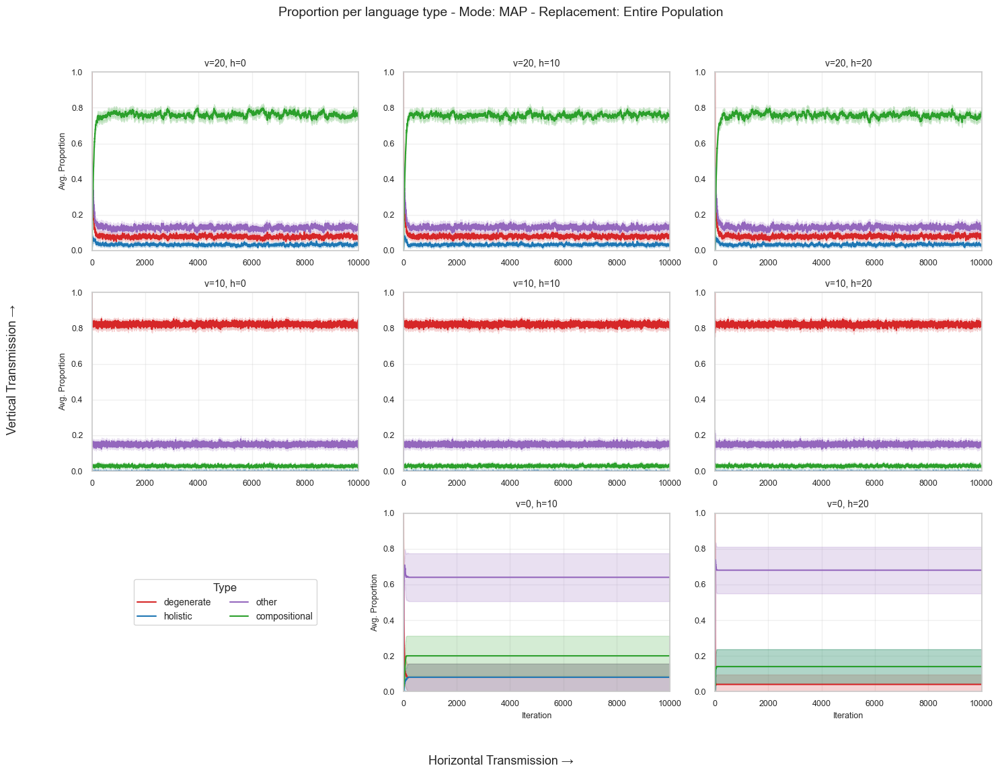

In [54]:
for replace in replaced:
    for mode in modes:
        csv_path = f"Experiment_1/plots/{mode}/{replace}"
        df = pd.read_csv(f"{csv_path}/{mode}.csv")
        save_path = csv_path
        plot_grid(df, save_path, mode, replace, 0)

### Experiment 5: impact observed data

In [48]:
# merging and saving bigger csv files....

alphas = [0.0, 0.00025, 0.0005, 0.00075, 0.001]
group_rounds = [0, 10, 20]
turnover_rounds = [0, 10, 20]
pop_sizes = [25]
n_runs = 50
modes = ["Sample", "MAP"]
replaced = [False, True]

missing_files = []  # collect all missing file paths

for alpha in alphas:
    for mode in modes:
        for replace in replaced:
            list_df = []

            for group_round in group_rounds:
                for turnover_round in turnover_rounds:
                    for pop_size in pop_sizes:
                        if (group_round != 0 or turnover_round != 0):
                            name = f"h{group_round}_v{turnover_round}_p{pop_size}"
                            results_dir = f"Experiment_5/results_snellius_extra/{mode}/{replace}/{alpha}/{name}"

                            for run in range(n_runs):
                                file_path = f"{results_dir}/run{run}.csv"
                                
                                if os.path.exists(file_path):
                                    try:
                                        df = pd.read_csv(file_path)
                                        df["condition"] = f"{turnover_round} vertical transmission, {group_round} horizontal transmission"
                                        list_df.append(df)
                                    except Exception as e:
                                        print(f"Error reading {file_path}: {e}")
                                        missing_files.append(f"ERROR READING: {file_path}")
                                else:
                                    missing_files.append(file_path)

            # Save combined CSV only if we loaded any data
            if list_df:
                save_dir = f"Experiment_5/plots/0_10_20/{alpha}/{mode}/{replace}"
                os.makedirs(save_dir, exist_ok=True)
                big_df = pd.concat(list_df, ignore_index=True)
                big_df.to_csv(f"{save_dir}/{mode}.csv", index=False)
                print(f"Saved combined CSV for alpha={alpha}, mode={mode}, replace={replace}")
            else:
                print(f"No data found for alpha={alpha}, mode={mode}, replace={replace}")


Saved combined CSV for alpha=0.0, mode=Sample, replace=False
Saved combined CSV for alpha=0.0, mode=Sample, replace=True
Saved combined CSV for alpha=0.0, mode=MAP, replace=False
Saved combined CSV for alpha=0.0, mode=MAP, replace=True
Saved combined CSV for alpha=0.00025, mode=Sample, replace=False
Saved combined CSV for alpha=0.00025, mode=Sample, replace=True
Saved combined CSV for alpha=0.00025, mode=MAP, replace=False
Saved combined CSV for alpha=0.00025, mode=MAP, replace=True
Saved combined CSV for alpha=0.0005, mode=Sample, replace=False
Saved combined CSV for alpha=0.0005, mode=Sample, replace=True
Saved combined CSV for alpha=0.0005, mode=MAP, replace=False
Saved combined CSV for alpha=0.0005, mode=MAP, replace=True
Saved combined CSV for alpha=0.00075, mode=Sample, replace=False
Saved combined CSV for alpha=0.00075, mode=Sample, replace=True
Saved combined CSV for alpha=0.00075, mode=MAP, replace=False
Saved combined CSV for alpha=0.00075, mode=MAP, replace=True
Saved combin

In [46]:
def fast_plot_exp1_by_alpha2(alphas, mode, base_path, replace_all, title, save_path):
  
    # Define consistent color palette and order
    palette = [
        "#F0C77B", "#E69F00",  # Golden-orange (group 1)
        "#B4C9F0", "#56B4E9", "#0072B2",  # Blue-purple (group 2)
        "#B7E3CD", "#73D6B1", "#009E73"   # Teal-green (group 3)
    ]

    hue_order = [
        "0 vertical transmission, 10 horizontal transmission",
        "0 vertical transmission, 20 horizontal transmission", 
        "10 vertical transmission, 0 horizontal transmission", 
        "10 vertical transmission, 10 horizontal transmission",
        "10 vertical transmission, 20 horizontal transmission", 
        "20 vertical transmission, 0 horizontal transmission",
        "20 vertical transmission, 10 horizontal transmission", 
        "20 vertical transmission, 20 horizontal transmission"
    ]
    condition_to_color = dict(zip(hue_order, palette))

    # --- Helper to compute summary stats ---
    def compute_summary(df):
        grouped = df.groupby(['condition', 'generation'])['compositional']
        mean = grouped.mean()
        sem = grouped.sem()
        ci_hi = mean + 1.96 * sem
        ci_lo = mean - 1.96 * sem
        return pd.DataFrame({'mean': mean, 'ci_lo': ci_lo, 'ci_hi': ci_hi}).reset_index()

    # --- Figure setup (3x2 grid) ---
    fig, axes = plt.subplots(3, 2, figsize=(12, 12), sharey=True)
    axes = axes.flatten()

    for i, alpha in enumerate(alphas):
        print(alpha)
        ax = axes[i]
        csv_path = f"{base_path}/{alpha}/{mode}/{replace_all}/{mode}.csv"
        df = pd.read_csv(csv_path)
        summary = compute_summary(df)

        for condition in hue_order:
            cond_data = summary[summary['condition'] == condition]
            if cond_data.empty:
                continue
            ax.plot(cond_data['generation'], cond_data['mean'],
                    label=condition, color=condition_to_color[condition])
            ax.fill_between(cond_data['generation'], cond_data['ci_lo'], cond_data['ci_hi'],
                            alpha=0.05, color=condition_to_color[condition], rasterized=True)
            
            final_gen = cond_data['generation'].max()
            final_row = cond_data[cond_data['generation'] == final_gen]
            if not final_row.empty:
                mean_val = final_row['mean'].values[0]
                ci_lo_val = final_row['ci_lo'].values[0]
                ci_hi_val = final_row['ci_hi'].values[0]
                print(f"  {condition}: {mean_val:.3f} (95% CI: {ci_lo_val:.3f} – {ci_hi_val:.3f})")

        ax.set_title(f"α = {alpha}")
        ax.set_xlabel("Iteration")
        if i % 2 == 0:
            ax.set_ylabel("Proportion compositional")
        ax.grid(True)
        ax.tick_params(labelleft=True)
        ax.set_xlim(cond_data['generation'].min(), cond_data['generation'].max())

    # --- Hide the last (unused) subplot and place the legend there ---
    legend_ax = axes[len(alphas)]
    legend_ax.axis('off')

    # --- Legend grouping ---
    group1 = hue_order[0:2]
    group2 = hue_order[2:5]
    group3 = hue_order[5:8]

    def dummy_line():
        return Line2D([], [], linestyle='none')

    def get_legend_items(group, target_len):
        handles = [Line2D([0], [0], color=condition_to_color[cond], lw=3) for cond in group]
        labels = group
        while len(handles) < target_len:
            handles.append(dummy_line())
            labels.append("")
        return handles, labels

    # Combine all groups without dummy padding
    flat_handles = [Line2D([0], [0], color=condition_to_color[cond], lw=3) for cond in hue_order]
    flat_labels = hue_order


    legend_ax.legend(
        handles=flat_handles,
        labels=flat_labels,
        title="Condition",
        loc='center',
        ncol=1,
        fontsize='small',
        title_fontsize='medium',
        frameon=True,
        framealpha=1.0,
        edgecolor='grey',
        columnspacing=1.5,
        handletextpad=0.5
    )

    fig.suptitle(title, fontsize=20)
    fig.tight_layout(rect=[0, 0.01, 1, 0.95])

    # Ensure directory exists
    os.makedirs(os.path.dirname(save_path), exist_ok=True)

    plt.savefig(f"{save_path}.pdf", bbox_inches='tight', pad_inches=0.05)
    plt.show()
    plt.clf()


0.0


FileNotFoundError: [Errno 2] No such file or directory: 'Experiment_5/plots/0_10_20/0.0/MAP/True/MAP.csv'

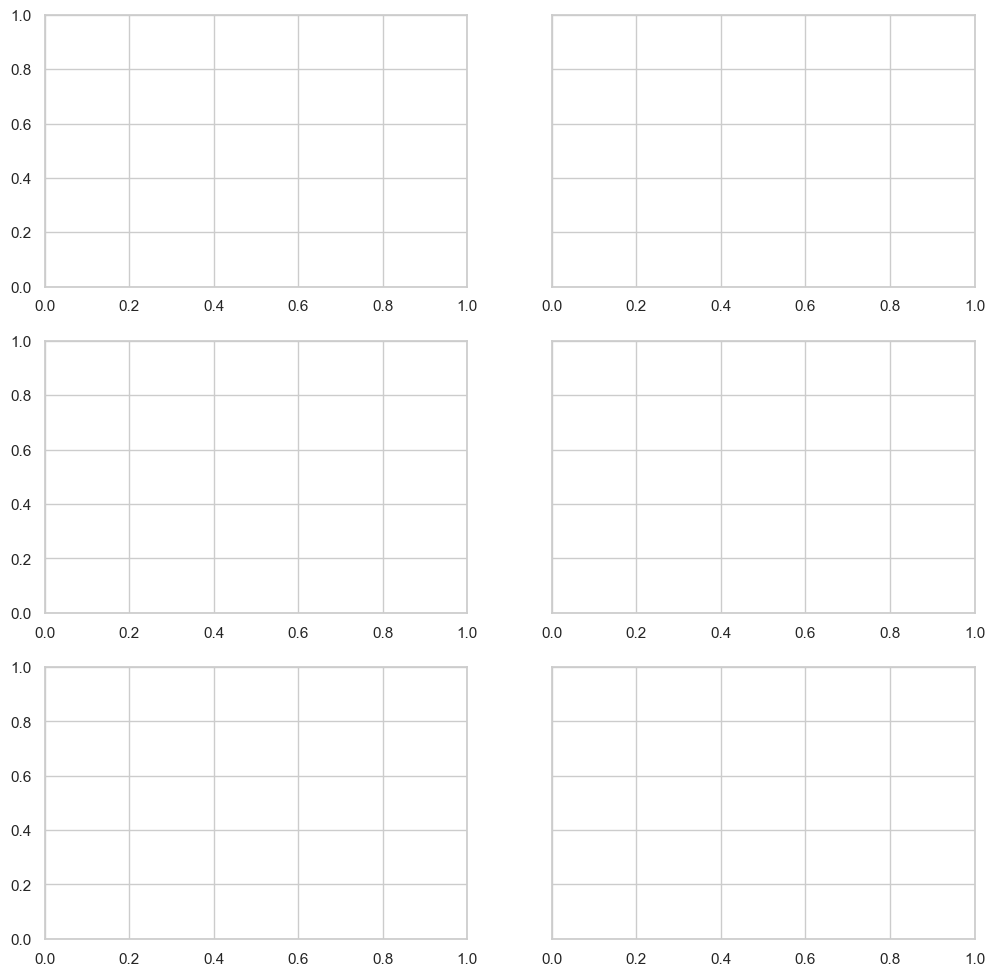

In [47]:
alphas = [0.0, 0.00025, 0.0005, 0.00075, 0.001]
modes = ["MAP", "Sample"]
base_path = "Experiment_5/plots/0_10_20"

for mode in modes:
    for replace_all in [True, False]:
        subtitle = "All agents replaced" if replace_all else "One agent replaced"
        title = f"Proportion of compositionality — Mode: {mode} — {subtitle}"
        save_path = f"{base_path}/combined/{mode}_{'replaced' if replace_all else 'not_replaced'}"
        
        fast_plot_exp1_by_alpha2(
            alphas=alphas,
            mode=mode,
            base_path=base_path,
            replace_all=replace_all,
            title=title,
            save_path=save_path
        )


In [ ]:

def fast_plot_exp1_2(csv_path_replaced, csv_path_not_replaced, title, save_path):
    # Load both datasets
    df_replaced = pd.read_csv(f"{csv_path_replaced}.csv")
    df_not_replaced = pd.read_csv(f"{csv_path_not_replaced}.csv")

    # Define consistent color palette and order
    palette = [
        "#F0C77B", "#E69F00",  # Golden-orange (group 1)
        "#B4C9F0", "#56B4E9", "#0072B2",  # Blue-purple (group 2)
        "#B7E3CD", "#73D6B1", "#009E73"   # Teal-green (group 3)
    ]

    hue_order = [
        "0 vertical transmission, 10 horizontal transmission",
        "0 vertical transmission, 20 horizontal transmission", 
        "10 vertical transmission, 0 horizontal transmission", 
        "10 vertical transmission, 10 horizontal transmission",
        "10 vertical transmission, 20 horizontal transmission", 
        "20 vertical transmission, 0 horizontal transmission",
        "20 vertical transmission, 10 horizontal transmission", 
        "20 vertical transmission, 20 horizontal transmission"
    ]

    # Mapping conditions to colors
    condition_to_color = dict(zip(hue_order, palette))

    # Helper: calculate CI and return summary
    def compute_summary(df):
        grouped = df.groupby(['condition', 'generation'])['compositional']
        mean = grouped.mean()
        sem = grouped.sem()
        ci_hi = mean + 1.96 * sem
        ci_lo = mean - 1.96 * sem
        return pd.DataFrame({
            'mean': mean,
            'ci_lo': ci_lo,
            'ci_hi': ci_hi
        }).reset_index()

    summary_replaced = compute_summary(df_replaced)
    summary_not_replaced = compute_summary(df_not_replaced)

    # Setup subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharey=True)


    def plot_summary(ax, summary, subtitle, show_ylabel=True):

        for i, condition in enumerate(hue_order):
            cond_data = summary[summary['condition'] == condition]
            if cond_data.empty:
                continue
            ax.plot(cond_data['generation'], cond_data['mean'], label=condition, color=condition_to_color[condition])
            ax.fill_between(cond_data['generation'], cond_data['ci_lo'], cond_data['ci_hi'],
                            alpha=0.05, color=condition_to_color[condition], rasterized=True)
        ax.set_title(subtitle)
        ax.set_xlabel("Iteration")
        if show_ylabel:
            ax.set_ylabel("Proportion compositional")
        else:
            ax.set_ylabel("")
        ax.grid(True)
        ax.tick_params(labelleft=True)
        ax.set_xlim(cond_data['generation'].min(), cond_data['generation'].max())

    # Plot both panels
    plot_summary(ax1, summary_replaced, "All agents replaced each generation", show_ylabel=True)
    plot_summary(ax2, summary_not_replaced, "One agent replaced each generation", show_ylabel=False)

        # Group the hue_order into color groups
    group1 = hue_order[0:2]  # Golden-orange
    group2 = hue_order[2:5]  # Blue-purple
    group3 = hue_order[5:8]  # Teal-green

    # Dummy line for spacing
    def dummy_line():
        return Line2D([], [], linestyle='none')  # Invisible, valid handle

    # Helper to generate legend handles/labels for a group
    def get_legend_items(group, target_len):
        handles = [Line2D([0], [0], color=condition_to_color[cond], lw=3) for cond in group]
        labels = group
        # Pad to match longest column
        while len(handles) < target_len:
            handles.append(dummy_line())
            labels.append("")
        return handles, labels

    # Compute max column height
    max_len = max(len(group1), len(group2), len(group3))

    # Get padded handles and labels
    handles1, labels1 = get_legend_items(group1, max_len)
    handles2, labels2 = get_legend_items(group2, max_len)
    handles3, labels3 = get_legend_items(group3, max_len)

    # Combine for legend
    flat_handles = handles1 + handles2 + handles3
    flat_labels = labels1 + labels2 + labels3

    # Add custom legend
    fig.legend(
        handles=flat_handles,
        labels=flat_labels,
        title="Condition",
        loc='lower center',
        ncol=3,  # One column per group
        fontsize='small',
        title_fontsize='medium',
        frameon=True,                      
        framealpha=1.0,                    
        edgecolor='grey', 
        columnspacing=1.5,
        handletextpad=0.5,
        bbox_to_anchor=(0.5, -0.18)
    )

    fig.suptitle(title, fontsize=20)
    fig.tight_layout(rect=[0, 0.01, 1, 0.93])  # Adjust for legend space
    plt.savefig(f"{save_path}.pdf", bbox_inches='tight', pad_inches=0.05)
    plt.show()
    plt.clf()


In [ ]:
for alpha in alphas:
    for mode in modes:
        csv_path1 = f"Experiment_5/plots/0_10_20/{alpha}/{mode}/True/{mode}"
        csv_path2 = f"Experiment_5/plots/0_10_20/{alpha}/{mode}/False/{mode}"

        print(alpha, mode)
            
        title = f" Alpha = {alpha} - Proportion of compositionality - horizontal and vertical transmission - Mode: {mode}"
        fast_plot_exp1_2(csv_path1, csv_path2, title, save_path=f"Experiment_5/plots/{alpha}/{mode}")


In [59]:
def plot_grid_2(big_df, save_to, mode, replace, alpha):
    fig, axes = plt.subplots(3, 3, figsize=(15, 12))  # no sharex/sharey

    verticals = [20, 10, 0]      # top → bottom
    horizontals = [0, 10, 20]    # left → right

    for i, v in enumerate(verticals):
        for j, h in enumerate(horizontals):
            ax = axes[i, j]

            # skip bottom-left corner (v=0, h=0)
            if v == 0 and h == 0:
                ax.axis("off")

                # place legend here in 2x2 grid
                handles, labels = axes[0,1].get_legend_handles_labels()
                ax.legend(
                    handles, labels,
                    loc="center",
                    ncol=2,        # 2x2 grid
                    title="Type",
                    fontsize=10,
                    frameon=True
                )
                continue

            subset = big_df[
                (big_df["condition"] == f"{v} vertical transmission, {h} horizontal transmission")
            ]

            if not subset.empty:
                plot_each_language_type_ax(ax, subset, f"v={v}, h={h}")
            else:
                ax.axis("off")

            # axis labels on all subplots
            if v == 0:
                ax.set_xlabel("Iteration", fontsize=9)
            if h == 0 or (v==0 and h==10):
                ax.set_ylabel("Avg. Proportion", fontsize=9)
            
            ax.set_xlim(big_df['generation'].min(), big_df['generation'].max())

    # Axis annotations
    fig.text(0.5, 0.01, "Horizontal Transmission →", ha="center", fontsize=13)
    fig.text(0.01, 0.5, "Vertical Transmission →", va="center", rotation="vertical", fontsize=13)

    # Title at the top
    replace_str = "Entire Population" if replace else "1 Agent per Model Step"
    if alpha == 0:
        fig.suptitle(f"Mode: {mode}, Replacement: {replace_str}", fontsize=14, y=0.95)
    else:
        fig.suptitle(f"Alpha: {alpha}, Mode: {mode}, Replacement: {replace_str}", fontsize=14, y=0.95)


    plt.tight_layout(rect=[0.05, 0.05, 1, 0.93])  # adjust to keep title
    plt.savefig(f"{save_to}.pdf", bbox_inches="tight", pad_inches=0.05)
    plt.show()


In [ ]:
for alpha in alphas:
    for replace in replaced:
        for mode in modes:
            csv_path = f"Experiment_1/plots/0_10_20/{alpha}/{mode}/{replace}/{mode}"
            df = pd.read_csv(f"{csv_path}.csv")
            save_path = csv_path
            plot_grid_2(df, save_path, mode, replace, alpha)

## Experiment 2


In [61]:
group_rounds = [20]
turnover_rounds = [20]
pop_sizes = [2, 10, 25, 50, 100, 200]
n_runs = 50
modes = ["Sample", "MAP"] 
replaced = [False, True]

In [ ]:
for mode in modes:
    for replace in replaced:
        list_df = []
        for group_round in group_rounds:
            for turnover_round in turnover_rounds:
                for pop_size in pop_sizes:
                    path = f"Experiment_2/results_snellius/{mode}/{replace}/h{group_round}_v{turnover_round}_p{pop_size}"
                    for run in range(n_runs):
                        df = pd.read_csv(f"{path}/run{run}.csv")
                        list_df.append(df)
        
        save_dir = f"Experiment_2/plots/{mode}/{turnover_round}/{replace}"
        os.makedirs(save_dir, exist_ok=True)  
        big_df = pd.concat(list_df)
        big_df.to_csv(f"{save_dir}/{mode}.csv")

In [62]:
def fast_plot_ex2(csv_path1, csv_path2, title, save_path):
    # Load both CSVs
    df1 = pd.read_csv(f"{csv_path1}.csv")
    df2 = pd.read_csv(f"{csv_path2}.csv")

    def compute_summary(df):
        grouped = df.groupby(['popsize', 'generation'])['compositional']
        mean = grouped.mean()
        sem = grouped.sem()
        ci_hi = mean + 1.96 * sem
        ci_lo = mean - 1.96 * sem
        return pd.DataFrame({'mean': mean, 'ci_lo': ci_lo, 'ci_hi': ci_hi}).reset_index()

    summary1 = compute_summary(df1)
    summary2 = compute_summary(df2)

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

    
    def plot_summary(ax, summary, title, labelyaxis):
        pops = sorted(summary['popsize'].unique())
        colors = plt.cm.viridis(np.linspace(0, 1, len(pops)))

        markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'x', '+']

        
        for i, pop in enumerate(summary['popsize'].unique()):
            pop_data = summary[summary['popsize'] == pop]
            ax.plot(pop_data['generation'], pop_data['mean'], color=colors[i], label=f'{pop}', marker=markers[i], markersize=7, markevery=750)
            ax.fill_between(pop_data['generation'], pop_data['ci_lo'], pop_data['ci_hi'], color=colors[i], alpha=0.05, rasterized=True)

            if pop_data.empty:
                continue
            final_gen = pop_data['generation'].max()
            final_row = pop_data[pop_data['generation'] == final_gen]
            if not final_row.empty:
                mean_val = final_row['mean'].values[0]
                ci_lo_val = final_row['ci_lo'].values[0]
                ci_hi_val = final_row['ci_hi'].values[0]
                print(f"  {pop}: {mean_val:.3f} (95% CI: {ci_lo_val:.3f} – {ci_hi_val:.3f})")
            
        if labelyaxis:
            ax.set_ylabel('Proportion compositional')
        else:
            ax.set_ylabel("")  # remove y-axis title
    
        ax.grid(True)
        ax.set_title(title)
        ax.set_xlabel('Iteration')
        ax.set_ylabel('Proportion compositional')
        ax.tick_params(labelleft=True)

    # Plot both
    plot_summary(ax1, summary1, "All agents replaced per iteration", True)
    plot_summary(ax2, summary2, "One agent replaced per iteration", False)

    # Shared legend below
    handles, labels = ax1.get_legend_handles_labels()
    fig.legend(handles, labels, title='Population Size', loc='lower center', ncol=len(labels))
    fig.suptitle(title, fontsize=20)

    ax1.set_xlim(summary1['generation'].min(), summary1['generation'].max())
    ax2.set_xlim(summary2['generation'].min(), summary2['generation'].max())

    # Layout cleanup
    fig.tight_layout(rect=[0, 0.05, 1, 0.95])  # Minimized bottom space
    plt.savefig(f"{save_path}.pdf", bbox_inches='tight', pad_inches=0.05)
    plt.show()


  2: 0.791 (95% CI: 0.712 – 0.871)
  10: 0.777 (95% CI: 0.737 – 0.818)
  25: 0.764 (95% CI: 0.741 – 0.788)
  50: 0.745 (95% CI: 0.729 – 0.760)
  100: 0.759 (95% CI: 0.747 – 0.771)
  200: 0.751 (95% CI: 0.743 – 0.759)
  2: 0.749 (95% CI: 0.668 – 0.830)
  10: 0.746 (95% CI: 0.703 – 0.788)
  25: 0.769 (95% CI: 0.744 – 0.794)
  50: 0.751 (95% CI: 0.734 – 0.767)
  100: 0.691 (95% CI: 0.675 – 0.707)
  200: 0.552 (95% CI: 0.531 – 0.573)


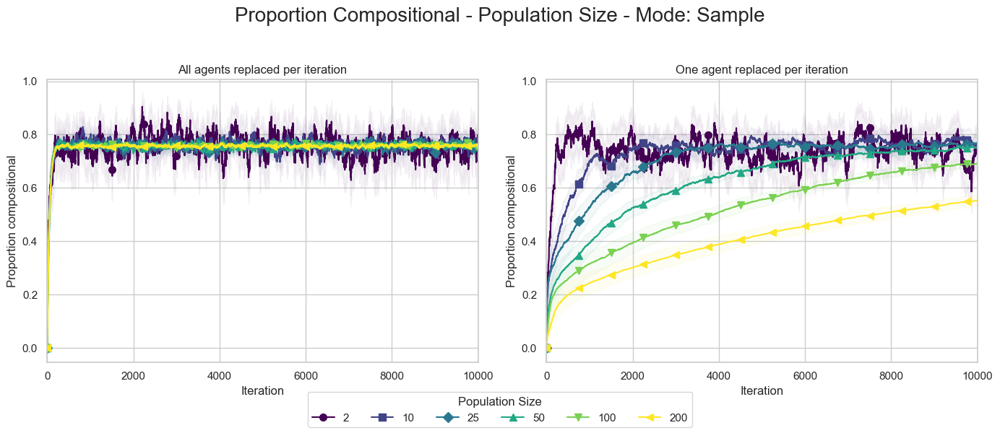

  2: 0.738 (95% CI: 0.648 – 0.828)
  10: 0.769 (95% CI: 0.735 – 0.803)
  25: 0.761 (95% CI: 0.735 – 0.786)
  50: 0.764 (95% CI: 0.748 – 0.780)
  100: 0.760 (95% CI: 0.750 – 0.769)
  200: 0.758 (95% CI: 0.751 – 0.766)
  2: 0.756 (95% CI: 0.681 – 0.832)
  10: 0.749 (95% CI: 0.717 – 0.782)
  25: 0.775 (95% CI: 0.751 – 0.800)
  50: 0.741 (95% CI: 0.724 – 0.758)
  100: 0.617 (95% CI: 0.603 – 0.630)
  200: 0.456 (95% CI: 0.443 – 0.468)


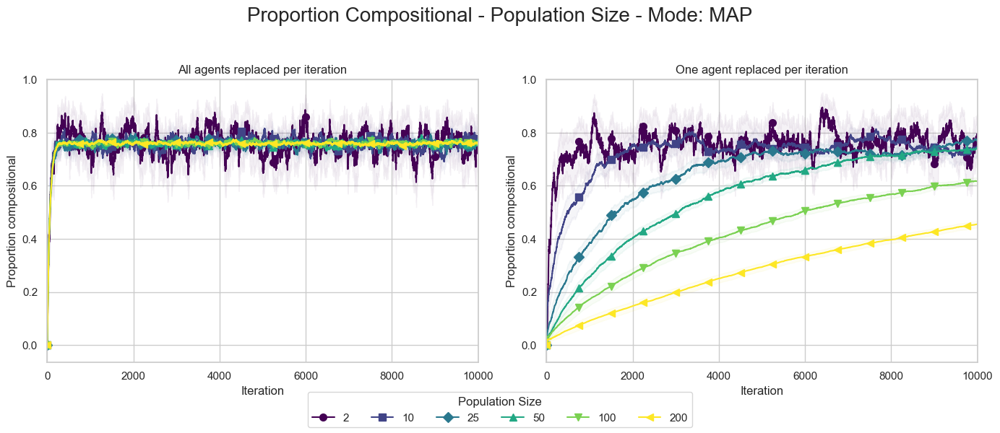

In [66]:
for mode in modes:
    save_dir1 = f"Experiment_2/plots/{mode}/20/True"
    save_dir2 = f"Experiment_2/plots/{mode}/20/False"
        
    csv_path1 = f"{save_dir1}/{mode}"
    csv_path2 = f"{save_dir2}/{mode}"
    
    fast_plot_ex2(csv_path1, csv_path2, f"Proportion Compositional - Population Size - Mode: {mode}", 
                  f"Experiment_2/plots/{mode}/{mode}20")

In [67]:
def plot_grid_popsize(big_df, save_to, mode, replace):
    population_sizes = [2, 10, 25, 50, 100, 200]  

    # Create a 2x3 grid of subplots
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))  
    axes = axes.flatten()  # flatten to iterate easily

    for j, r in enumerate(population_sizes):
        ax = axes[j]

        subset = big_df[big_df["popsize"] == r]

        if not subset.empty:
            plot_each_language_type_ax(ax, subset, f"Population size = {r}")
        else:
            ax.axis("off")

        # Axis labels
        ax.set_xlabel("Iteration", fontsize=9)
        if j % 3 == 0:  # first column
            ax.set_ylabel("Avg. Proportion", fontsize=9)
        
        # Limit x-axis to 0-10000
        ax.set_xlim(0, 10000)

    # Turn off any unused axes if population_sizes < total axes
    for k in range(len(population_sizes), len(axes)):
        axes[k].axis("off")

    # Legend: gather from first axis
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc="lower center",
        ncol=4,
        bbox_to_anchor=(0.5, -0.02),
        title="Type",
        fontsize=9,
        frameon=True
    )

    # Title
    replace_str = "Entire Population" if replace else "1 Agent per Iteration"
    fig.suptitle(f" Proportion per language type - Mode: {mode}, Replacement: {replace_str}", fontsize=14, y=0.95)

    plt.tight_layout(rect=[0.05, 0.05, 1, 0.9])
    plt.savefig(f"{save_to}.pdf", bbox_inches="tight", pad_inches=0.05)
    plt.show()


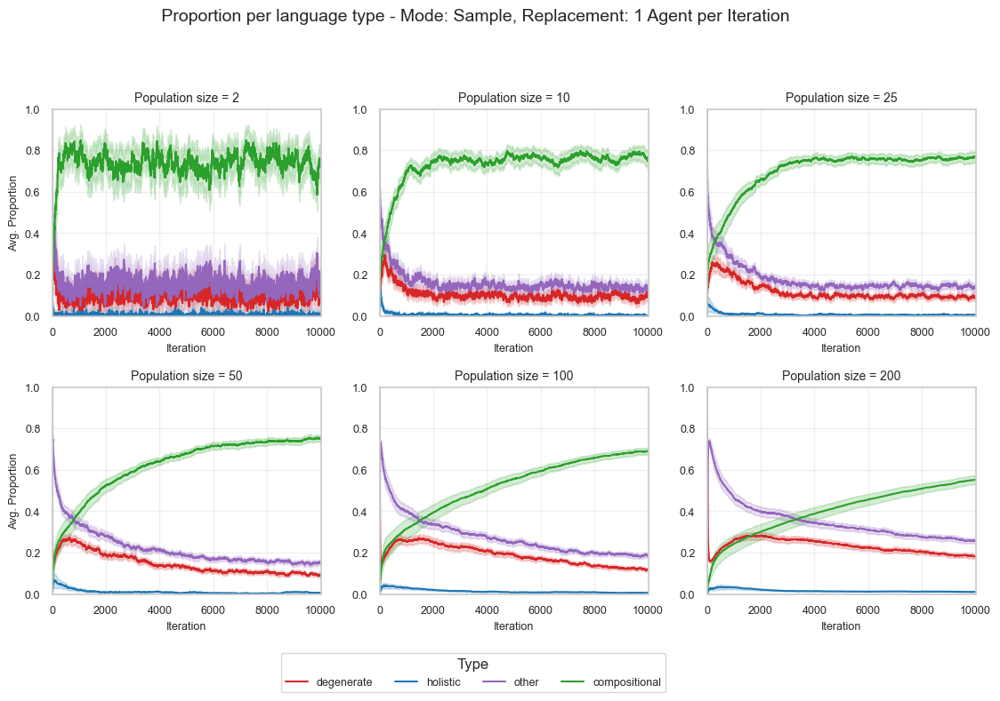

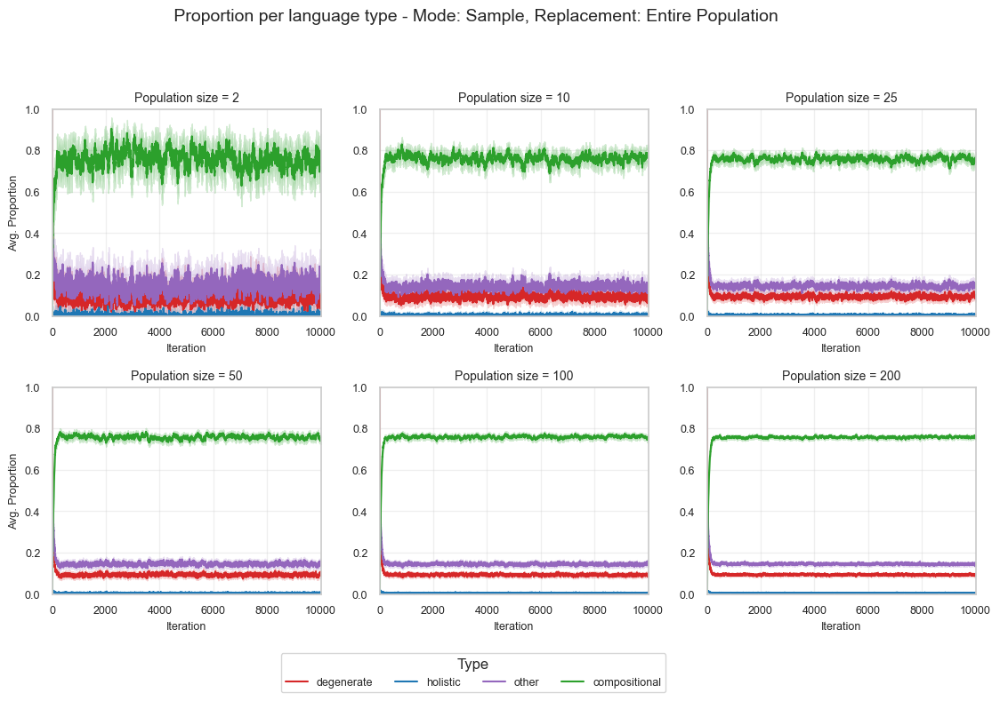

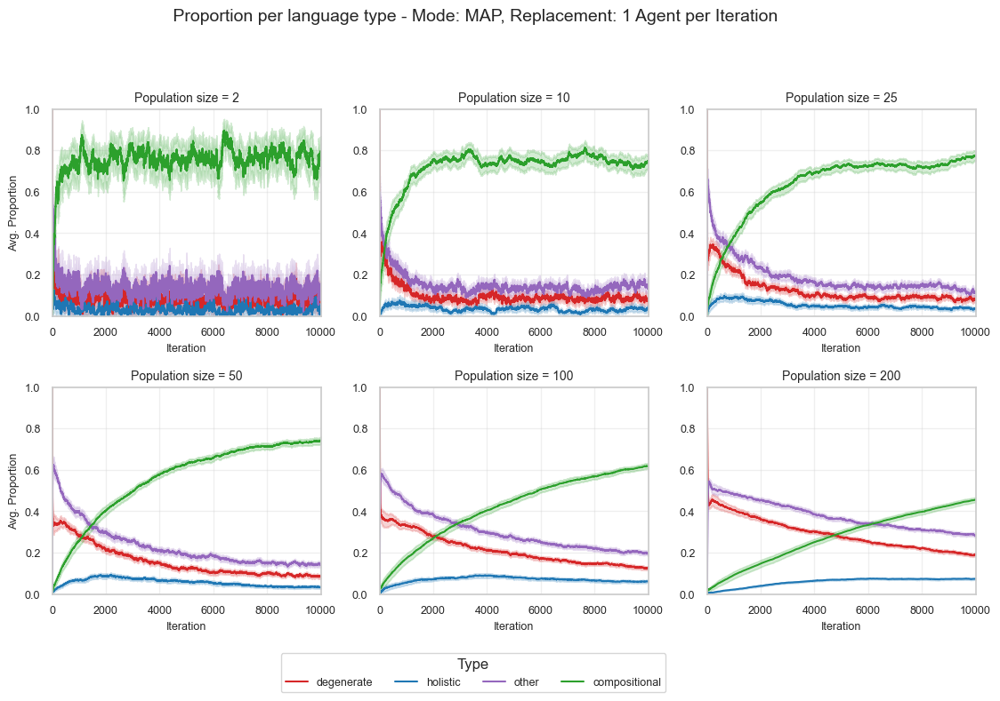

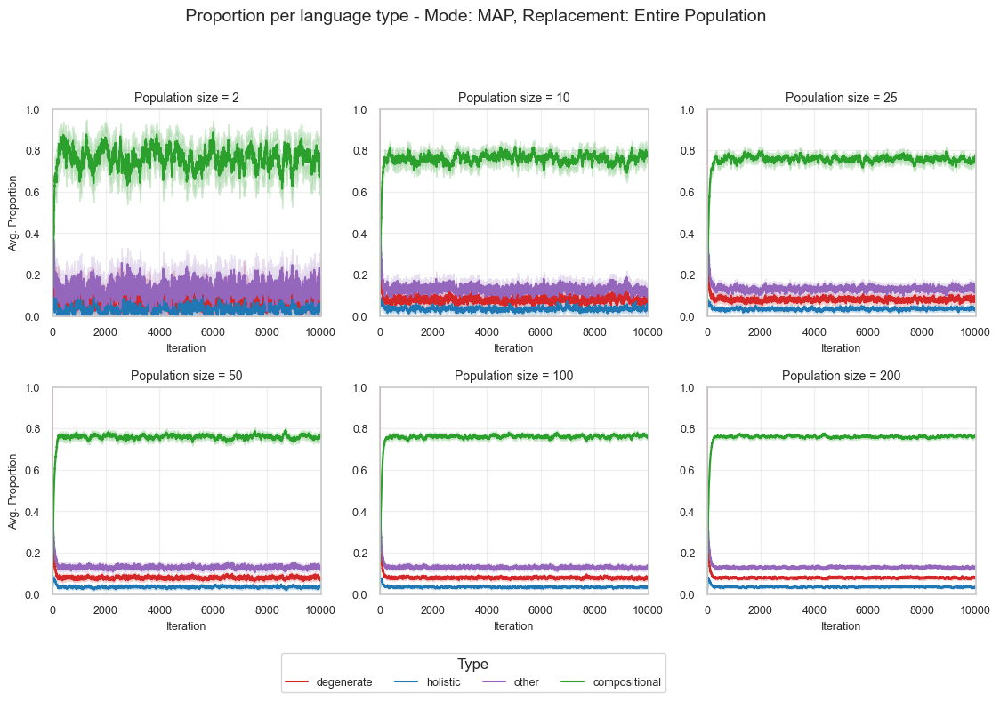

In [68]:
for mode in modes:
    for replace in replaced:
        name = f"Experiment_2/plots/{mode}/20/{replace}/{mode}"
        df = pd.read_csv(f"{name}.csv")
        plot_grid_popsize(df, f"{name}_{replace}", mode, replace)

## Experiment 3: networks

In [69]:
networks = ["fully-connected", "small-world", "scale-free", "hierarchical", "mobile-phone", "dynamic"]
modes = ["MAP", "Sample"]
n_runs = 50

In [ ]:
for mode in modes:
    list_df = []
    missing_runs = []  # to store missing files
    for network in networks:
        for run in range(n_runs):
            filepath = f"Experiment_3/results_snellius/{mode}/{network}/run{run}.csv"
            if not os.path.exists(filepath):
                print(f"Missing file: {filepath}")
                missing_runs.append(filepath)
                continue  # skip this run if file doesn't exist
            
            df = pd.read_csv(filepath)
            df["condition"] = network
            list_df.append(df)

    # Create directory if it doesn't exist
    save_dir = f"Experiment_3/plots/{mode}"
    os.makedirs(save_dir, exist_ok=True)  

    # Concatenate all dataframes (if any)
    if list_df:
        big_df = pd.concat(list_df)
        big_df.to_csv(f"{save_dir}/{mode}.csv", index=False)
        print(f"Saved {save_dir}/{mode}.csv")
    else:
        print(f"No data to save for mode {mode}")

    # Save missing runs to a text file
    if missing_runs:
        with open(f"{save_dir}/missing_runs.txt", "w") as f:
            for run_path in missing_runs:
                f.write(run_path + "\n")
        print(f"Missing runs logged at {save_dir}/missing_runs.txt")

Saved Experiment_3a/plots/MAP/MAP.csv
Saved Experiment_3a/plots/Sample/Sample.csv


In [70]:
def fast_plot_ex3(csv_path1, title, save_path):
    # Load CSV
    df1 = pd.read_csv(f"{csv_path1}.csv")


    # Helper function to compute CI summary
    def compute_summary(df):
        grouped = df.groupby(['condition', 'generation'])['compositional']
        mean = grouped.mean()
        sem = grouped.sem()
        ci_hi = mean + 1.96 * sem
        ci_lo = mean - 1.96 * sem
        return pd.DataFrame({'mean': mean, 'ci_lo': ci_lo, 'ci_hi': ci_hi}).reset_index()

    summary1 = compute_summary(df1)

    # Sort conditions
    conditions = sorted(summary1['condition'].unique())
    colors = plt.cm.viridis(np.linspace(0, 1, len(conditions)))
    condition_to_color = dict(zip(conditions, colors))

    # Set up the figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))

    markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'x', '+']

    # Plot each condition
    for i, condition in enumerate(conditions):
        cond_data = summary1[summary1['condition'] == condition]
        ax.plot(cond_data['generation'], cond_data['mean'], color=condition_to_color[condition], label=condition, marker=markers[i], markersize=7, markevery=750)
        ax.fill_between(cond_data['generation'], cond_data['ci_lo'], cond_data['ci_hi'],
                        color=condition_to_color[condition], alpha=0.05, rasterized=True)
        
        if cond_data.empty:
            continue
        final_gen = cond_data['generation'].max()
        final_row = cond_data[cond_data['generation'] == final_gen]
        if not final_row.empty:
            mean_val = final_row['mean'].values[0]
            ci_lo_val = final_row['ci_lo'].values[0]
            ci_hi_val = final_row['ci_hi'].values[0]
            print(f"  {condition}: {mean_val:.3f} (95% CI: {ci_lo_val:.3f} – {ci_hi_val:.3f})")

    # Axis labels and grid
    ax.set_title(title, fontsize=15)
    ax.set_xlabel('Iteration')
    ax.set_ylabel('Proportion compositional')
    ax.grid(True)
    ax.set_xlim(-1, summary1['generation'].max())

    # Legend below the plot
    handles = [Line2D([0], [0], color=condition_to_color[cond], marker=markers[i], lw=1) for i, cond in enumerate(conditions)]
    fig.legend(handles, conditions, title='Condition', loc='lower center',
               ncol=6, fontsize='small', title_fontsize='medium',
               frameon=True, framealpha=1.0, edgecolor='grey',
               bbox_to_anchor=(0.5, -0.15))

    # Tight layout with space for legend
    fig.tight_layout(rect=[0, 0.0, 1, 0.95])
    plt.savefig(f"{save_path}.pdf", bbox_inches='tight', pad_inches=0.05)
    plt.show()
    plt.clf()

  dynamic: 0.520 (95% CI: 0.380 – 0.659)
  fully-connected: 0.775 (95% CI: 0.751 – 0.800)
  hierarchical: 0.758 (95% CI: 0.733 – 0.783)
  mobile-phone: 0.774 (95% CI: 0.751 – 0.796)
  scale-free: 0.757 (95% CI: 0.736 – 0.777)
  small-world: 0.764 (95% CI: 0.743 – 0.785)


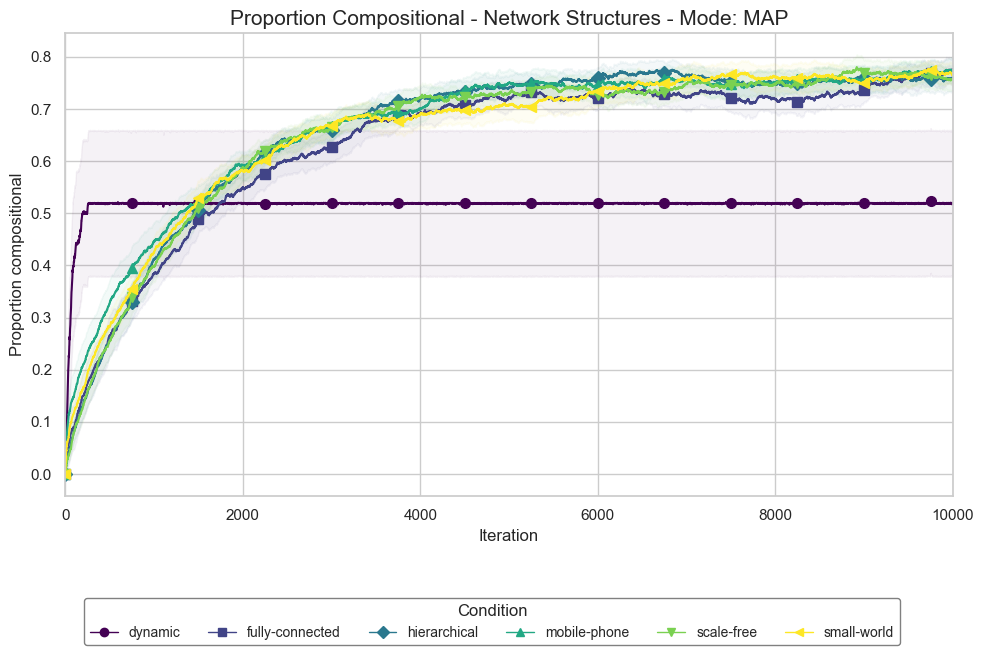

  dynamic: 0.679 (95% CI: 0.548 – 0.809)
  fully-connected: 0.769 (95% CI: 0.744 – 0.794)
  hierarchical: 0.745 (95% CI: 0.722 – 0.768)
  mobile-phone: 0.759 (95% CI: 0.736 – 0.782)
  scale-free: 0.745 (95% CI: 0.719 – 0.770)
  small-world: 0.751 (95% CI: 0.723 – 0.779)


<Figure size 640x480 with 0 Axes>

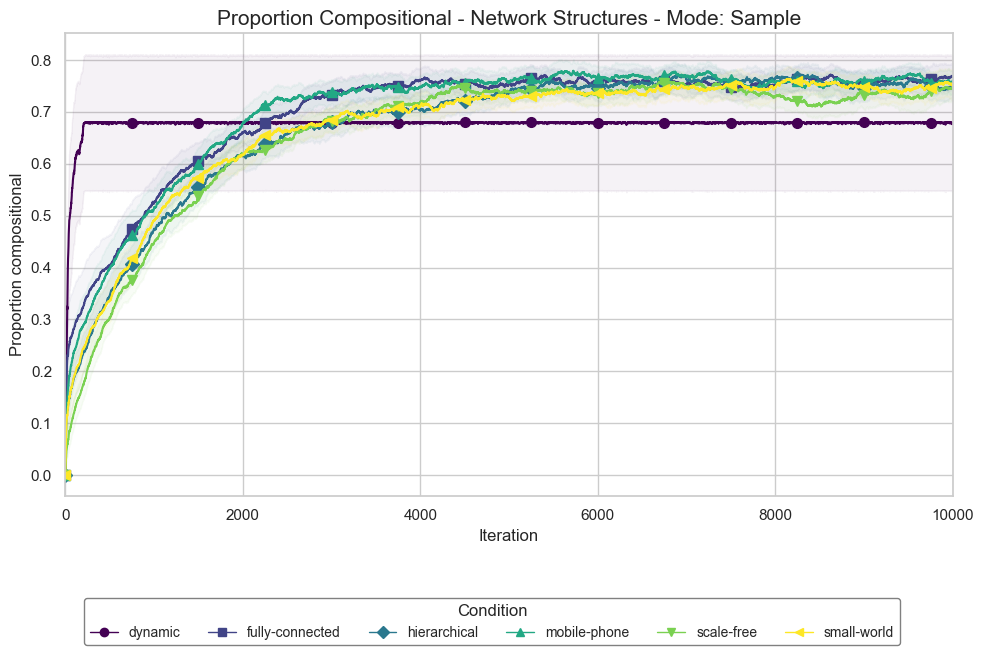

<Figure size 640x480 with 0 Axes>

In [ ]:
for mode in modes:
    path = f"Experiment_3/plots/{mode}/{mode}"

    fast_plot_ex3(path, f"Proportion Compositional - Network Structures - Mode: {mode}", f"Experiment_3a/plots/{mode}/{mode}")


In [72]:
def plot_grid_network(big_df, save_to, mode, replace):
    network_types = ["fully-connected", "small-world", "scale-free", "dynamic", "hierarchical", "mobile-phone"]  

    # Create a 2x3 grid of subplots
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))  
    axes = axes.flatten()  # flatten to iterate easily

    for j, r in enumerate(network_types):
        ax = axes[j]
        subset = big_df[big_df["condition"] == r]

        if not subset.empty:
            plot_each_language_type_ax(ax, subset, f"Network Type = {r}")
        else:
            ax.axis("off")

        # Axis labels
        ax.set_xlabel("Iteration", fontsize=9)
        if j % 3 == 0:  # first column
            ax.set_ylabel("Avg. Proportion", fontsize=9)
        
        # Limit x-axis to 0-10000
        ax.set_xlim(0, 10000)


    # Turn off any unused axes if population_sizes < total axes
    for k in range(len(network_types), len(axes)):
        axes[k].axis("off")

    # Legend: gather from first axis
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc="lower center",
        ncol=4,
        bbox_to_anchor=(0.5, -0.02),
        title="Type",
        fontsize=9,
        frameon=True
    )

    # Title
    replace_str = "1 Agent per Iteration"
    fig.suptitle(f" Proportion per language type - Mode: {mode}, Replacement: {replace_str}", fontsize=14, y=0.95)

    plt.tight_layout(rect=[0.05, 0.05, 1, 0.9])
    plt.savefig(f"{save_to}_types.pdf", bbox_inches="tight", pad_inches=0.05)
    plt.show()


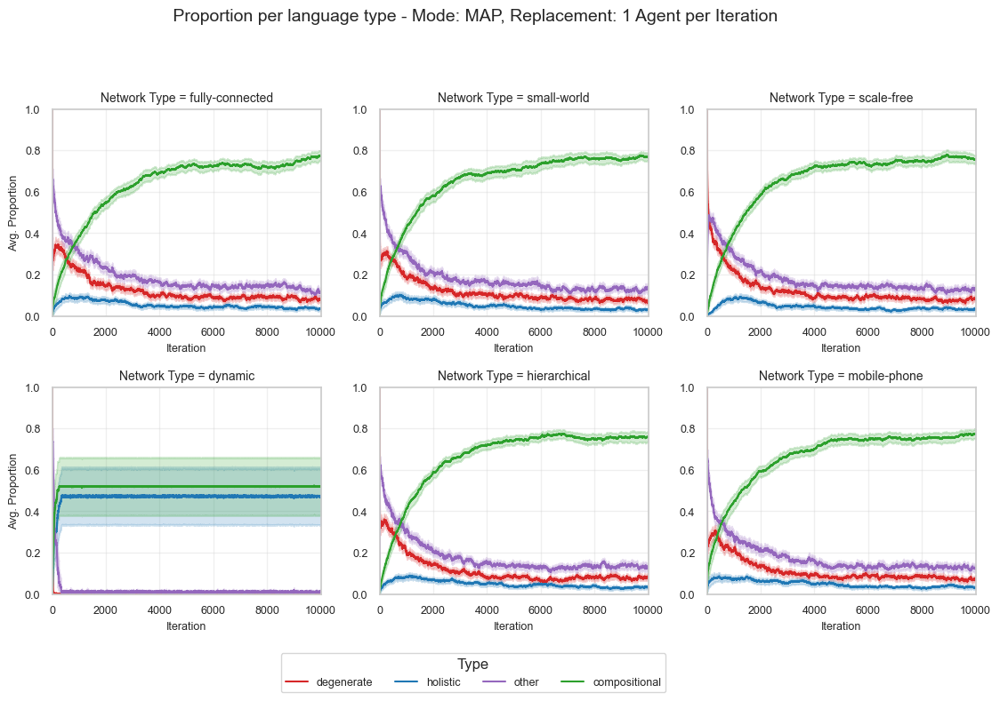

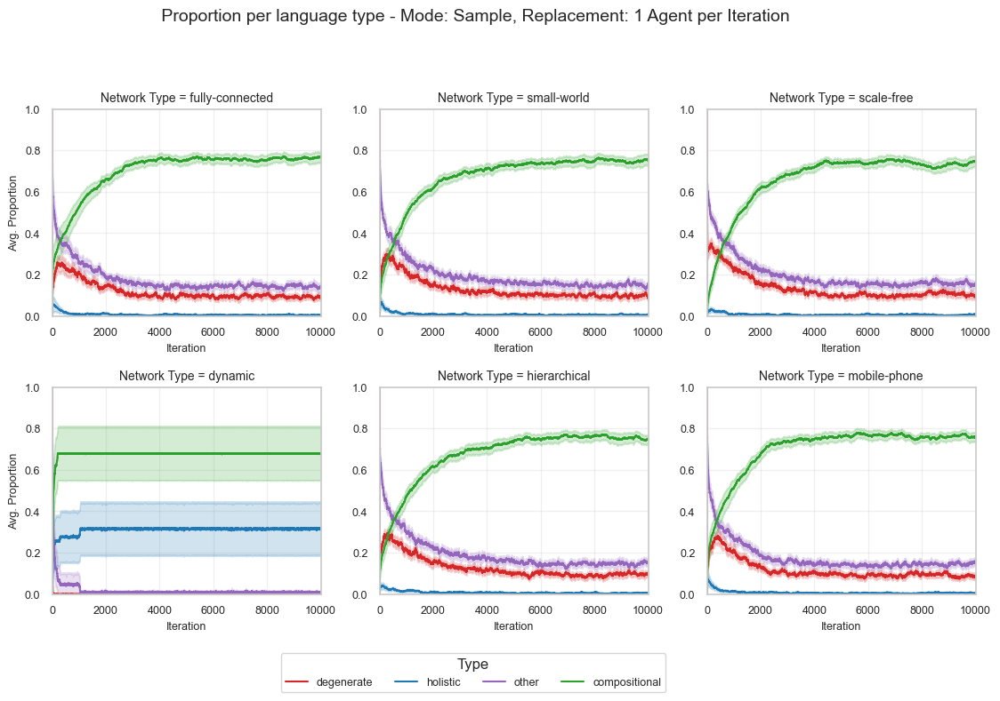

In [ ]:
for mode in modes:
    path = f"Experiment_3/plots/{mode}/{mode}"
    df = pd.read_csv(f"{path}.csv")

    plot_grid_network(df, path, mode, False)


In [ ]:

for mode in modes:
    df_list = []
    for network in networks:
        for run in range(n_runs):
            path = f"Experiment_3/results_snellius/{mode}/{network}/network_data/run{run}.csv"
            df = pd.read_csv(path)
            df['type'] = network
            df_list.append(df)

    save_dir = f"Experiment_3/plots/network_data/{mode}"
    os.makedirs(save_dir, exist_ok=True)

    big_df = pd.concat(df_list)

    # Compute mean and std
    grouped = big_df.groupby('type')
    means = grouped.mean()
    stds = grouped.std()

    # Rename columns for clarity
    means.columns = [f"{col}_mean" for col in means.columns]
    stds.columns = [f"{col}_std" for col in stds.columns]

    # Combine into one DataFrame
    result = pd.concat([means, stds], axis=1)

    # Save to CSV
    result.to_csv(f"{save_dir}/means.csv")

    

In [ ]:
# Combine mean and std into "mean ± std" formatted strings
nice_table = pd.DataFrame(index=means.index)

for col in grouped.mean().columns:
    if col != "Unnamed: 0":
        nice_table[col] = means[f"{col}_mean"].round(3).astype(str) + " ± " + stds[f"{col}_std"].round(3).astype(str)

print(nice_table)
nice_table.to_csv(f"{save_dir}/nice_table.csv")


### Experiment 8

In [74]:
def fast_plot_ex3_alpha(csv_path1, title, save_path):
    # Load CSV
    df1 = pd.read_csv(f"{csv_path1}.csv")


    # Helper function to compute CI summary
    def compute_summary(df):
        grouped = df.groupby(['condition', 'generation'])['compositional']
        mean = grouped.mean()
        sem = grouped.sem()
        ci_hi = mean + 1.96 * sem
        ci_lo = mean - 1.96 * sem
        return pd.DataFrame({'mean': mean, 'ci_lo': ci_lo, 'ci_hi': ci_hi}).reset_index()

    summary1 = compute_summary(df1)

    # Sort conditions
    conditions = sorted(summary1['condition'].unique())
    colors = plt.cm.viridis(np.linspace(0, 1, len(conditions)))
    condition_to_color = dict(zip(conditions, colors))

    # Set up the figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot each condition
    for condition in conditions:
        cond_data = summary1[summary1['condition'] == condition]
        ax.plot(cond_data['generation'], cond_data['mean'], color=condition_to_color[condition], label=condition)
        ax.fill_between(cond_data['generation'], cond_data['ci_lo'], cond_data['ci_hi'],
                        color=condition_to_color[condition], alpha=0.05, rasterized=True)
        
        if cond_data.empty:
            continue
        final_gen = cond_data['generation'].max()
        final_row = cond_data[cond_data['generation'] == final_gen]
        if not final_row.empty:
            mean_val = final_row['mean'].values[0]
            ci_lo_val = final_row['ci_lo'].values[0]
            ci_hi_val = final_row['ci_hi'].values[0]
            print(f"  {condition}: {mean_val:.3f} (95% CI: {ci_lo_val:.3f} – {ci_hi_val:.3f})")

    # Axis labels and grid
    ax.set_title(title, fontsize=15)
    ax.set_xlabel('Iteration')
    ax.set_ylabel('Proportion compositional')
    ax.grid(True)
    ax.set_xlim(-1, 10000)

    # Legend below the plot
    handles = [Line2D([0], [0], color=condition_to_color[cond], lw=1) for cond in conditions]
    fig.legend(handles, conditions, title='Condition', loc='lower center',
               ncol=6, fontsize='small', title_fontsize='medium',
               frameon=True, framealpha=1.0, edgecolor='grey',
               bbox_to_anchor=(0.5, -0.15))

    # Tight layout with space for legend
    fig.tight_layout(rect=[0, 0.0, 1, 0.95])
    plt.savefig(f"{save_path}.pdf", bbox_inches='tight', pad_inches=0.05)
    plt.show()
    plt.clf()

In [75]:
def plot_grid_network_alpha(big_df, save_to, mode):
    network_types = ["fully-connected", "small-world", "scale-free", "dynamic", "hierarchical", "mobile-phone"]  

    # Create a 2x3 grid of subplots
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))  
    axes = axes.flatten()  # flatten to iterate easily

    for j, r in enumerate(network_types):
        ax = axes[j]
        subset = big_df[big_df["condition"] == r]

        if not subset.empty:
            plot_each_language_type_ax(ax, subset, f"Network Type = {r}")
        else:
            ax.axis("off")

        # Axis labels
        ax.set_xlabel("Iteration", fontsize=7)
        if j % 3 == 0:  # first column
            ax.set_ylabel("Avg. Proportion", fontsize=7)
        
        # Limit x-axis to 0-10000
        ax.set_xlim(0, 10000)

    # Turn off any unused axes if population_sizes < total axes
    for k in range(len(network_types), len(axes)):
        axes[k].axis("off")

    # Legend: gather from first axis
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc="lower center",
        ncol=4,
        bbox_to_anchor=(0.5, -0.02),
        title="Type",
        fontsize=9,
        frameon=True
    )

    # Title
    fig.suptitle(f" Proportion per language type - Mode: {mode}", fontsize=14, y=0.95)

    plt.tight_layout(rect=[0.05, 0.05, 1, 0.9])
    plt.savefig(f"{save_to}_types.pdf", bbox_inches="tight", pad_inches=0.05)
    plt.show()


In [ ]:
for mode in modes:
    list_df = []
    for network in networks:
        for run in range(n_runs):
            df = pd.read_csv(f"Experiment_8/results_snellius/alpha/{mode}/{network}/run{run}.csv")
            df["condition"] = network
            list_df.append(df)

    save_dir = f"Experiment_8/plots/alpha/{mode}"
    os.makedirs(save_dir, exist_ok=True)  
    big_df = pd.concat(list_df)
    big_df.to_csv(f"{save_dir}/{mode}.csv")

    

KeyboardInterrupt: 

  fully-connected: 0.896 (95% CI: 0.813 – 0.980)
  hierarchical: 0.940 (95% CI: 0.887 – 0.994)
  mobile-phone: 0.917 (95% CI: 0.841 – 0.993)
  scale-free: 0.958 (95% CI: 0.924 – 0.993)
  small-world: 0.877 (95% CI: 0.796 – 0.957)


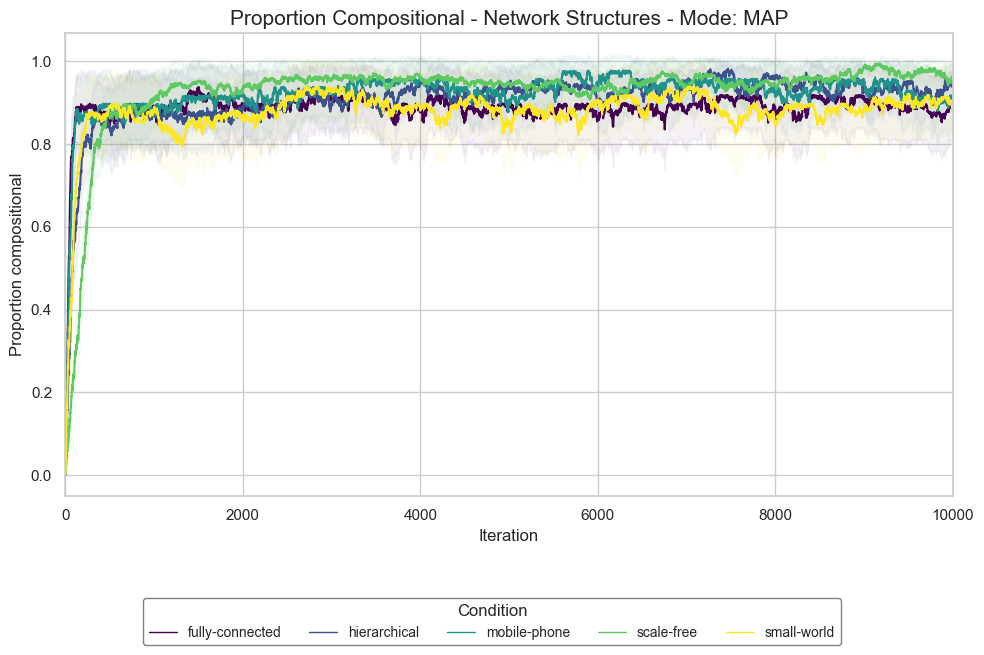

  fully-connected: 0.975 (95% CI: 0.935 – 1.014)
  hierarchical: 0.977 (95% CI: 0.938 – 1.016)
  mobile-phone: 0.955 (95% CI: 0.900 – 1.009)
  scale-free: 0.993 (95% CI: 0.987 – 0.999)
  small-world: 0.942 (95% CI: 0.886 – 0.999)


<Figure size 640x480 with 0 Axes>

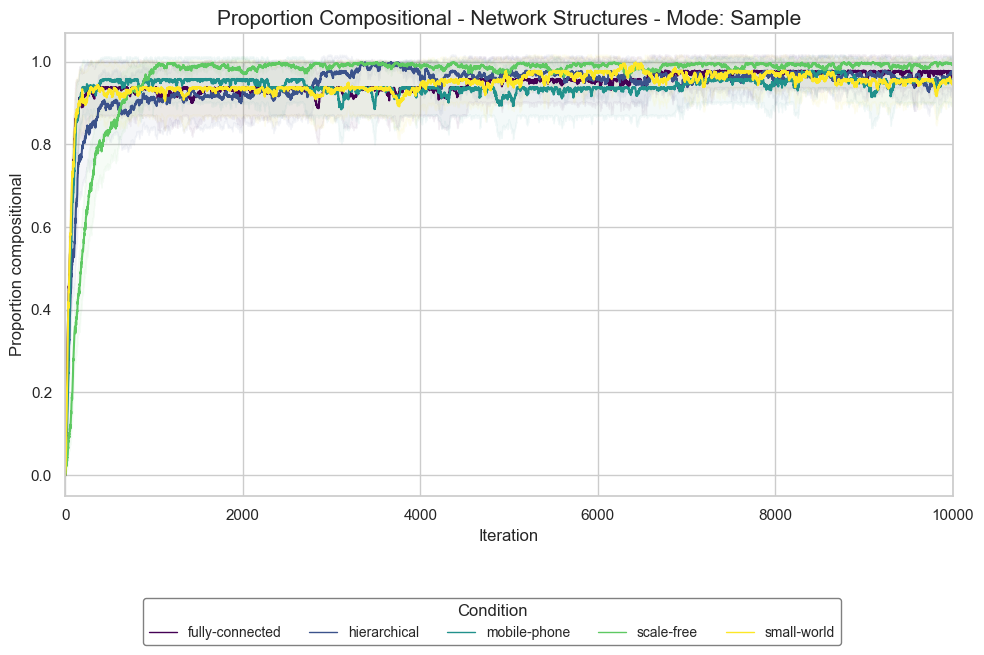

<Figure size 640x480 with 0 Axes>

In [ ]:
for mode in modes:
    path = f"Experiment_8/plots/alpha/{mode}/{mode}"

    fast_plot_ex3_alpha(path, f"Proportion Compositional - Network Structures - Mode: {mode}", f"Experiment_3a/plots/alpha/{mode}/{mode}")


In [ ]:
for mode in modes:
    path = f"Experiment_8/plots/alpha/{mode}/{mode}"
    df = pd.read_csv(f"{path}.csv")

    plot_grid_network_alpha(df, path, mode)


### Experiment 4

In [ ]:
modes = ["Sample", "MAP"]
probs = [0.0, 0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.90, 1.0]
n_runs = 50

for mode in modes:
    list_df = []
    missing_runs = []

    for prob in probs:
        for run in range(n_runs):
            filepath = f"Experiment_4/results_snellius/{mode}/{prob}/run{run}.csv"

            if not os.path.exists(filepath):
                print(f"Missing file: {filepath}")
                missing_runs.append(filepath)
                continue  # skip if missing

            try:
                df = pd.read_csv(filepath)
                df["condition"] = prob
                df["run"] = run
                df["mode"] = mode
                list_df.append(df)
            except Exception as e:
                print(f"Error reading {filepath}: {e}")
                missing_runs.append(filepath)
                continue

    save_dir = f"Experiment_4/plots/{mode}"
    os.makedirs(save_dir, exist_ok=True)

    if list_df:
        big_df = pd.concat(list_df, ignore_index=True)

        big_df.to_csv(f"{save_dir}/{mode}.csv", index=False)
        print(f"Saved {save_dir}/{mode}.csv ({len(big_df)} rows)")
    else:
        print(f"No valid data found for mode={mode}")

    # Write missing runs to text file
    if missing_runs:
        missing_path = f"{save_dir}/missing_runs.txt"
        with open(missing_path, "w") as f:
            for filepath in missing_runs:
                f.write(filepath + "\n")
        print(f"Missing runs logged in {missing_path}")

Saved replace/plots/Sample/Sample.csv (4500450 rows)
Saved replace/plots/MAP/MAP.csv (4500450 rows)


In [84]:
def fast_plot_replace(csv_path1, title, save_path):
    # Load CSV
    df1 = pd.read_csv(f"{csv_path1}.csv")

    # Helper function to compute CI summary
    def compute_summary(df):
        grouped = df.groupby(['condition', 'generation'])['compositional']
        mean = grouped.mean()
        sem = grouped.sem()
        ci_hi = mean + 1.96 * sem
        ci_lo = mean - 1.96 * sem
        return pd.DataFrame({'mean': mean, 'ci_lo': ci_lo, 'ci_hi': ci_hi}).reset_index()

    summary1 = compute_summary(df1)

    # Sort conditions
    conditions = sorted(summary1['condition'].unique())

    # Use Set3 colormap
    colors = plt.cm.tab20(np.linspace(0, 1, len(conditions)))
    condition_to_color = dict(zip(conditions, colors))

    markers = ['o', 's', 'D', '^', 'v', '<', '>', 'p', '*', 'h', 'x', '+']
    marker_cycle = {cond: markers[i % len(markers)] for i, cond in enumerate(conditions)}

    # Set up the figure and axis
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot each condition
    for condition in conditions:
        cond_data = summary1[summary1['condition'] == condition]
        ax.plot(
            cond_data['generation'], cond_data['mean'],
            color=condition_to_color[condition],
            marker=marker_cycle[condition],
            label=condition,
            markersize=7.5, linewidth=1, markevery=750
        )
        ax.fill_between(
            cond_data['generation'],
            cond_data['ci_lo'], cond_data['ci_hi'],
            color=condition_to_color[condition],
            alpha=0.05,
            rasterized=True
        )

        if cond_data.empty:
            continue
        final_gen = cond_data['generation'].max()
        final_row = cond_data[cond_data['generation'] == final_gen]
        if not final_row.empty:
            mean_val = final_row['mean'].values[0]
            ci_lo_val = final_row['ci_lo'].values[0]
            ci_hi_val = final_row['ci_hi'].values[0]
            print(f"  {condition}: {mean_val:.3f} (95% CI: {ci_lo_val:.3f} – {ci_hi_val:.3f})")

    # Axis labels and grid
    ax.set_title(title, fontsize=15)
    ax.set_xlabel('Iterations')
    ax.set_ylabel('Proportion compositional')
    ax.grid(True)
    ax.set_xlim(-1, summary1['generation'].max())

    # Legend below the plot
    ax.legend(
        title='Condition',
        loc='lower center',
        ncol=11, fontsize='small', title_fontsize='medium',
        frameon=True, framealpha=1.0, edgecolor='grey',
        bbox_to_anchor=(0.5, -0.25)
    )

    # Tight layout with space for legend
    fig.tight_layout(rect=[0, 0.0, 1, 0.95])
    plt.savefig(f"{save_path}.pdf", bbox_inches='tight', pad_inches=0.05)
    plt.show()
    plt.clf()


  0.0: 0.240 (95% CI: 0.120 – 0.360)
  0.01: 0.713 (95% CI: 0.589 – 0.838)
  0.05: 0.656 (95% CI: 0.524 – 0.787)
  0.1: 0.657 (95% CI: 0.525 – 0.789)
  0.25: 0.736 (95% CI: 0.614 – 0.858)
  0.5: 0.814 (95% CI: 0.707 – 0.921)
  0.75: 0.853 (95% CI: 0.757 – 0.949)
  0.9: 0.836 (95% CI: 0.734 – 0.938)
  1.0: 0.715 (95% CI: 0.590 – 0.840)


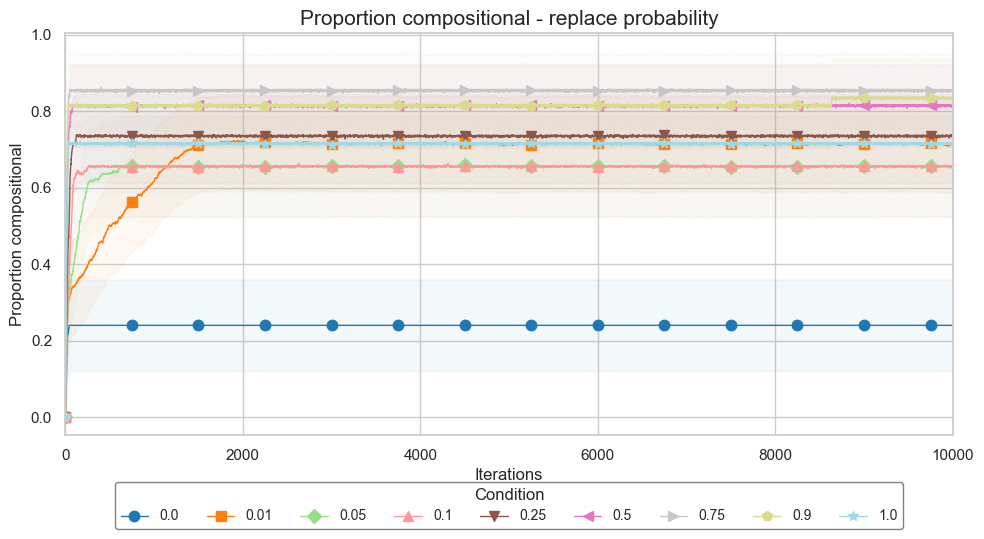

  0.0: 0.080 (95% CI: 0.004 – 0.156)
  0.01: 0.712 (95% CI: 0.588 – 0.836)
  0.05: 0.536 (95% CI: 0.397 – 0.674)
  0.1: 0.655 (95% CI: 0.523 – 0.786)
  0.25: 0.696 (95% CI: 0.568 – 0.823)
  0.5: 0.635 (95% CI: 0.501 – 0.768)
  0.75: 0.751 (95% CI: 0.633 – 0.869)
  0.9: 0.733 (95% CI: 0.611 – 0.854)
  1.0: 0.515 (95% CI: 0.376 – 0.653)


<Figure size 640x480 with 0 Axes>

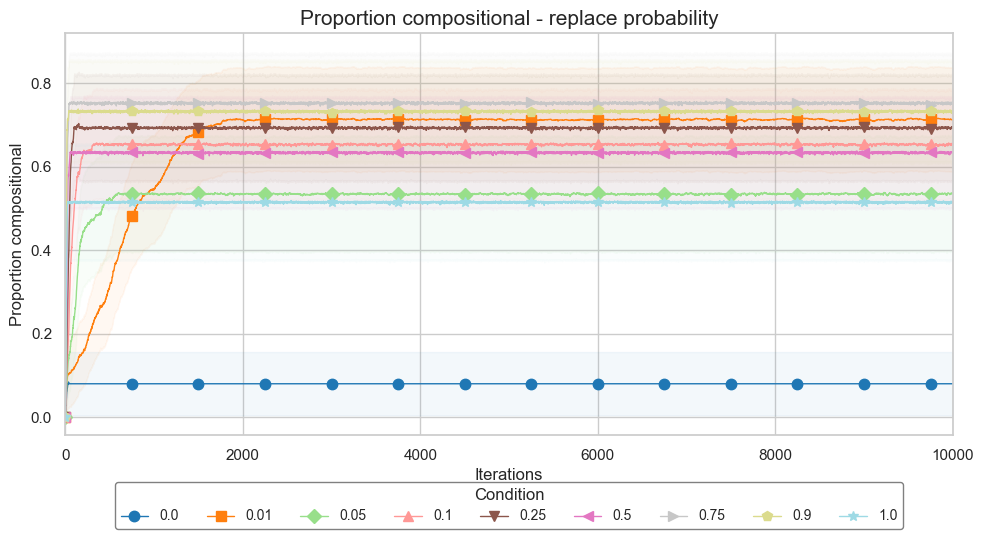

<Figure size 640x480 with 0 Axes>

In [ ]:
for mode in modes:
    path = f"Experiment_4/plots/{mode}/{mode}"

    fast_plot_replace(path, "Proportion compositional - replace probability", f"replace/plots/{mode}/{mode}")


In [86]:
def plot_grid_replace(big_df, save_to, mode):
    
    replace = [0.0, 0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.90, 1.0]  

    # Create a 3x3 grid of subplots
    fig, axes = plt.subplots(3, 3, figsize=(12, 12))  
    axes = axes.flatten()  # flatten to iterate easily

    for j, r in enumerate(replace):
        ax = axes[j]
        subset = big_df[big_df["condition"] == r]

        if not subset.empty:
            plot_each_language_type_ax(ax, subset, f"Replace probability = {r}")
        else:
            ax.axis("off")

        # Axis labels
        ax.set_xlabel("Iteration", fontsize=7)
        if j % 3 == 0:  # first column
            ax.set_ylabel("Avg. Proportion", fontsize=7)
        
        # Limit x-axis to 0-10000
        ax.set_xlim(0, 10000)

    # Turn off any unused axes if population_sizes < total axes
    for k in range(len(replace), len(axes)):
        axes[k].axis("off")

    # Legend: gather from first axis
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc="lower center",
        ncol=9,
        bbox_to_anchor=(0.5, -0.02),
        title="Type",
        fontsize=9,
        frameon=True
    )

    # Title
    fig.suptitle(f" Proportion per language type - Mode: {mode}", fontsize=14, y=0.95)

    plt.tight_layout(rect=[0.05, 0.05, 1, 0.9])
    plt.savefig(f"{save_to}_types.pdf", bbox_inches="tight", pad_inches=0.05)
    plt.show()
    plt.clf()


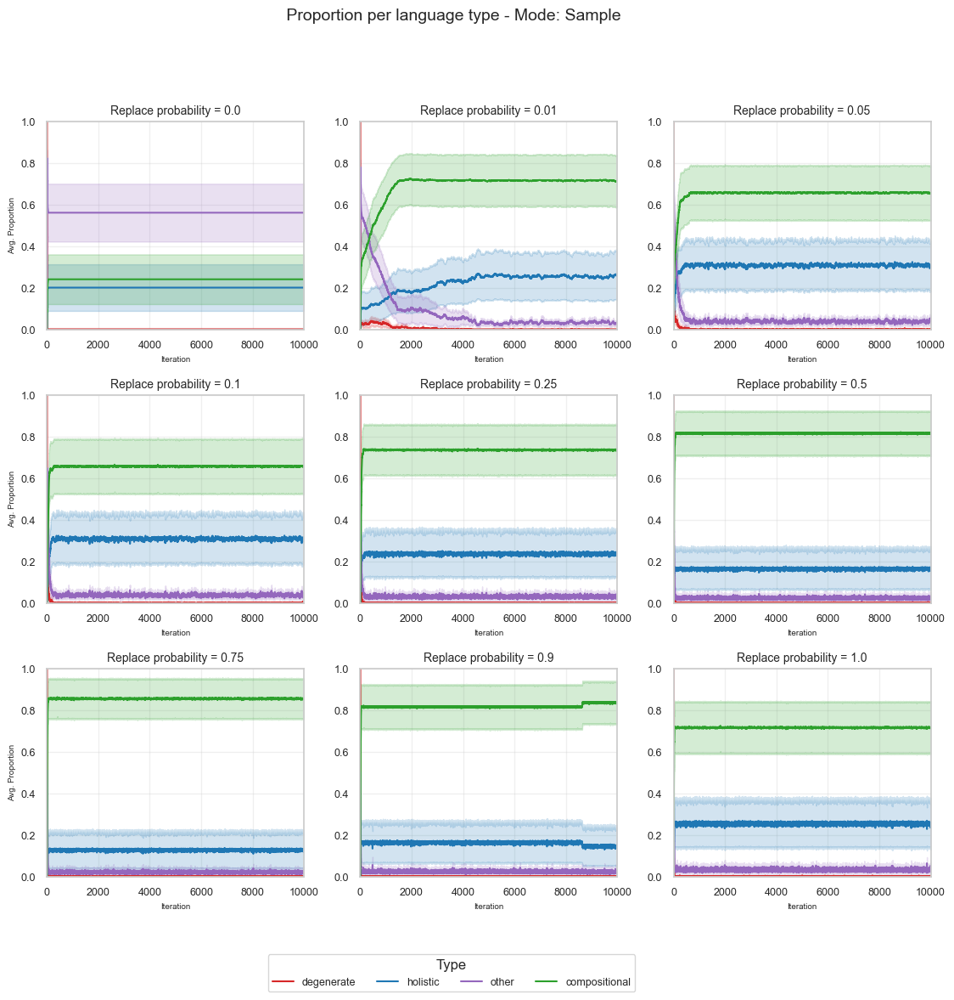

<Figure size 640x480 with 0 Axes>

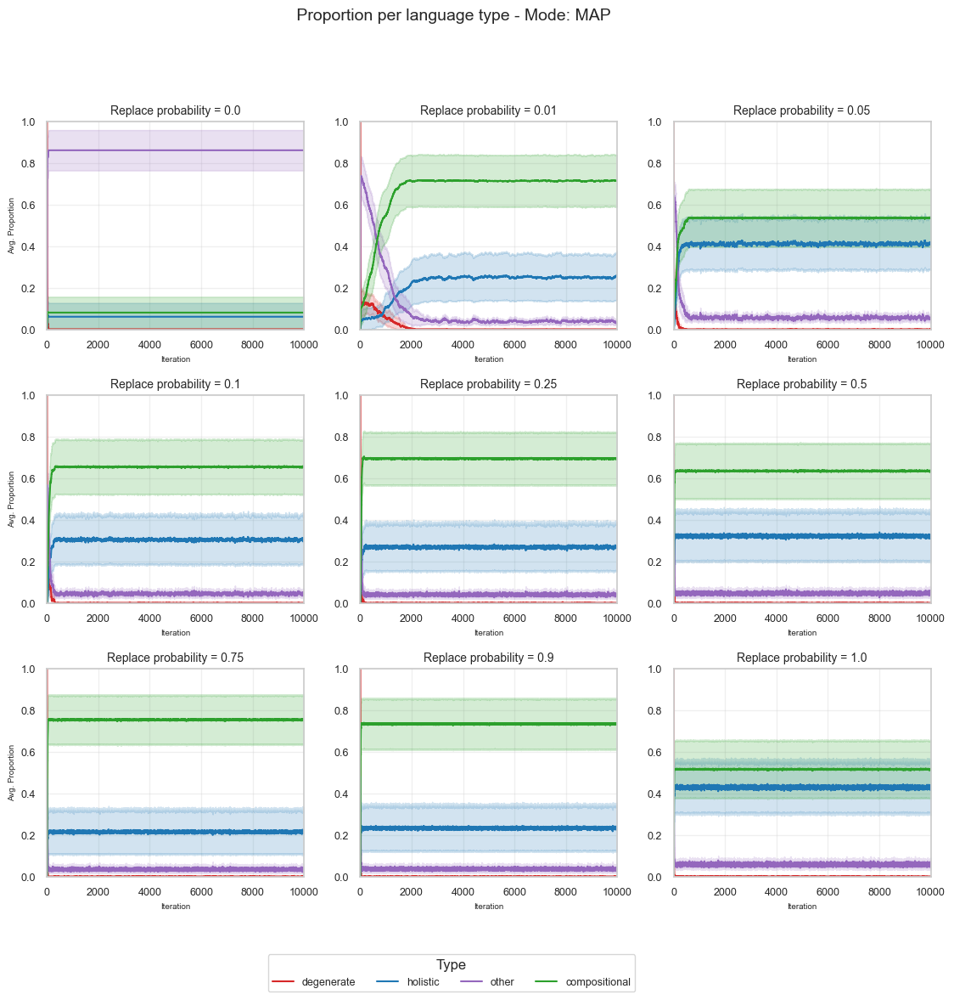

<Figure size 640x480 with 0 Axes>

In [ ]:
for mode in modes:
    path = f"Experiment_4/plots/{mode}/{mode}"
    df = pd.read_csv(f"{path}.csv")

    plot_grid_replace(df, path, mode)


### Experiment 9

In [105]:
modes = ["MAP", "Sample"]
replaces = [True, False]
init_rounds = [0, 5, 10, 20]
n_runs = 50


In [ ]:
for mode in modes:
    for replace in replaces:
        list_df = []
        for init_round in init_rounds:
            for run in range(n_runs):
                df = pd.read_csv(f"Experiment_9/results_snellius/{mode}/{replace}/{init_round}/run{run}.csv")
                df["condition"] = init_round
                list_df.append(df)

        save_dir = f"Experiment_9/plots/{mode}/{replace}"
        os.makedirs(save_dir, exist_ok=True)  
        big_df = pd.concat(list_df)
        big_df.to_csv(f"{save_dir}/{mode}.csv")

       

In [106]:
def fast_plot_holistic(csv_path1, csv_path2, title, save_path):
    # Load both CSVs
    df1 = pd.read_csv(f"{csv_path1}.csv")
    df2 = pd.read_csv(f"{csv_path2}.csv")

    def compute_summary(df):
        grouped = df.groupby(['condition', 'generation'])['compositional']
        mean = grouped.mean()
        sem = grouped.sem()
        ci_hi = mean + 1.96 * sem
        ci_lo = mean - 1.96 * sem
        return pd.DataFrame({'mean': mean, 'ci_lo': ci_lo, 'ci_hi': ci_hi}).reset_index()

    summary1 = compute_summary(df1)
    summary2 = compute_summary(df2)

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

    
    def plot_summary(ax, summary, title, labelyaxis):
        pops = sorted(summary['condition'].unique())
        colors = plt.cm.viridis(np.linspace(0, 1, len(pops)))
        
        for i, pop in enumerate(summary['condition'].unique()):
            pop_data = summary[summary['condition'] == pop]
            ax.plot(pop_data['generation'], pop_data['mean'], color=colors[i], label=f'{pop}')
            ax.fill_between(pop_data['generation'], pop_data['ci_lo'], pop_data['ci_hi'], color=colors[i], alpha=0.05, rasterized=True)
            
        if labelyaxis:
            ax.set_ylabel('Proportion compositional')
        else:
            ax.set_ylabel("")  # remove y-axis title
    
        ax.grid(True)
        ax.set_title(title)
        ax.set_xlabel('Iteration')
        ax.set_ylabel('Proportion compositional')
        ax.tick_params(labelleft=True)

    # Plot both
    plot_summary(ax1, summary1, "All agents replaced per iteration", True)
    plot_summary(ax2, summary2, "One agent replaced per iteration", False)

    # Shared legend below
    handles, labels = ax1.get_legend_handles_labels()
    fig.legend(handles, labels, title='Number of Initial Learning Rounds Holistic Language', loc='lower center', ncol=len(labels))
    fig.suptitle(title, fontsize=20)

    ax1.set_xlim(summary1['generation'].min(), summary1['generation'].max())
    ax2.set_xlim(summary2['generation'].min(), summary2['generation'].max())

    # Layout cleanup
    fig.tight_layout(rect=[0, 0.05, 1, 0.95])  # Minimized bottom space
    plt.savefig(f"{save_path}.pdf", bbox_inches='tight', pad_inches=0.05)
    plt.show()

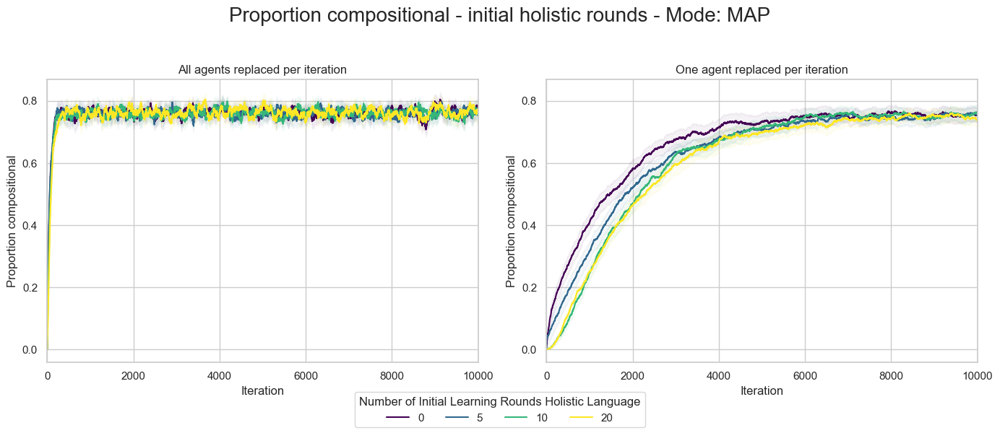

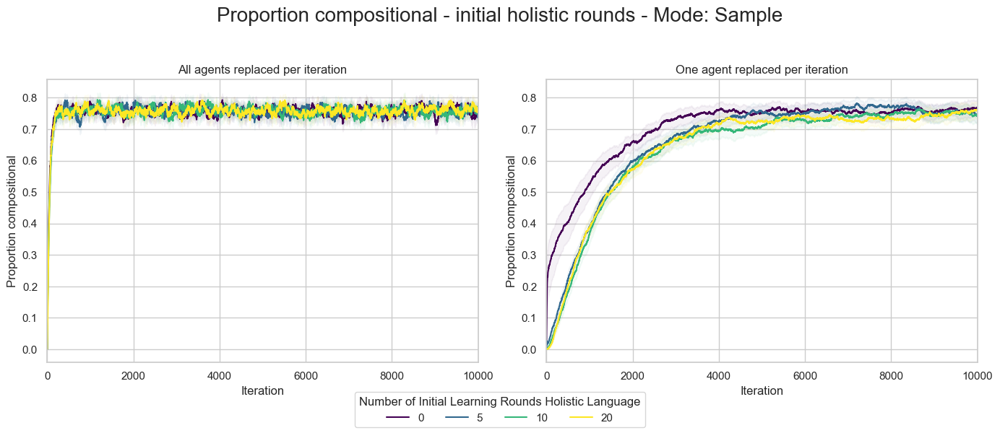

In [ ]:
for mode in modes:
    path1 = f"Experiment_9/plots/{mode}/True/{mode}"
    path2 = f"Experiment_9/plots/{mode}/False/{mode}"

    fast_plot_holistic(path1, path2, f"Proportion compositional - initial holistic rounds - Mode: {mode}", f"Holistic/plots/{mode}")


In [108]:
def plot_each_language_type_ax(ax, results, title):
    grouped = results.groupby("generation")[["degenerate", "holistic", "other", "compositional"]]
    
    # Compute mean, std, and n
    grouped_mean = grouped.mean()
    grouped_sem = grouped.sem()
    
    # Compute standard error and 95% CI using t-distribution
    ci95 = 1.96 * grouped_sem  

    colors = {
        "degenerate": "#d62728",    # red
        "holistic": "#1f77b4",      # blue
        "other": "#9467bd",         # purple
        "compositional": "#2ca02c"  # green
    }

    for col in grouped_mean.columns:
        mean = grouped_mean[col]
        ci = ci95[col]

        ax.plot(grouped_mean.index, mean, label=col, color=colors[col])
        ax.fill_between(grouped_mean.index, mean - ci, mean + ci, alpha=0.2, color=colors[col], rasterized=True)

    ax.set_ylim(0, 1)
    ax.set_title(title, fontsize=10)
    ax.grid(alpha=0.3)
    ax.tick_params(axis="both", which="both", labelsize=9)


def plot_grid_holistic(big_df, save_to, mode, replace):
    import matplotlib.pyplot as plt

    rounds = [0, 5, 10, 20]  # initial holistic learning rounds

    fig, axes = plt.subplots(1, len(rounds), figsize=(16, 4))  # single row

    for j, r in enumerate(rounds):
        ax = axes[j]

        subset = big_df[big_df["condition"] == r]  # assume column is "initial_rounds"

        if not subset.empty:
            plot_each_language_type_ax(ax, subset, f"Initial Rounds = {r}")
        else:
            ax.axis("off")

        # Axis labels
        ax.set_xlabel("Iteration", fontsize=9)
        if j == 0:
            ax.set_ylabel("Avg. Proportion", fontsize=9)
        ax.set_xlim(0, 10000)
    # Legend: gather from all axes
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc="lower center",
        ncol=4,
        bbox_to_anchor=(0.5, -0.05),
        title="Type",
        fontsize=9,
        frameon=True
    )

    # Title
    replace_str = "Entire Population" if replace else "1 Agent per Iteration"
    
    fig.suptitle(f"Mode: {mode}, Replacement: {replace_str}", fontsize=14, y=0.95)

    plt.tight_layout(rect=[0.05, 0.05, 1, 0.9])
    plt.savefig(f"{save_to}.pdf", bbox_inches="tight", pad_inches=0.05)
    plt.show()


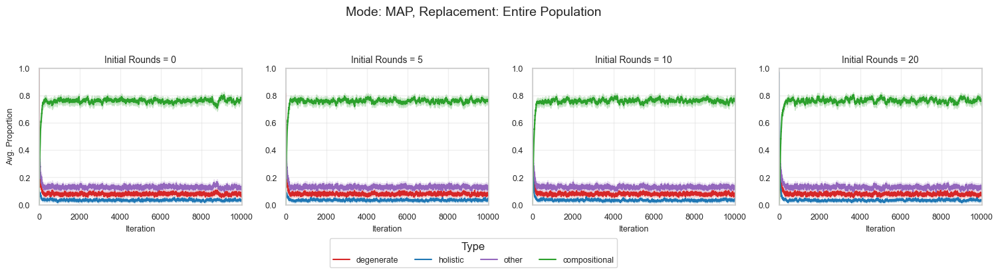

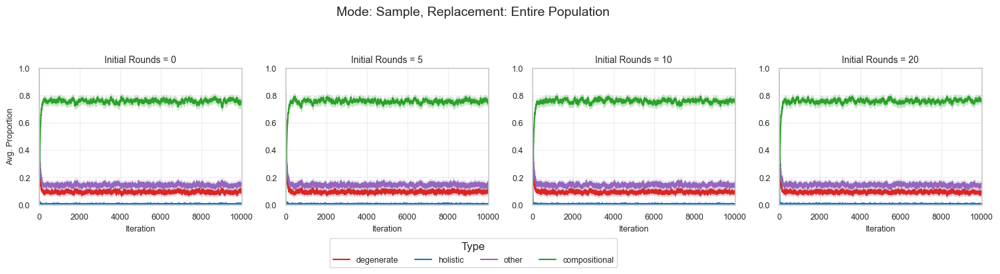

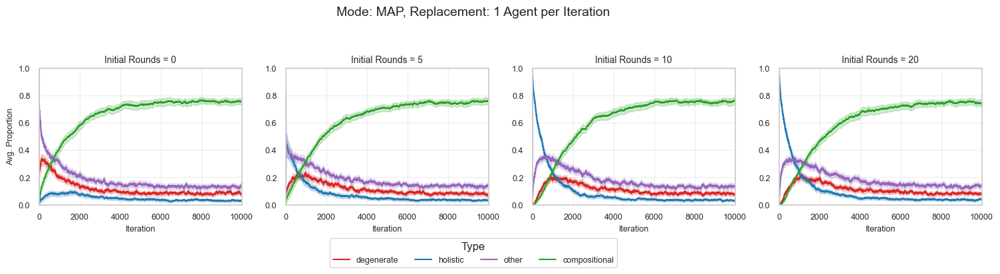

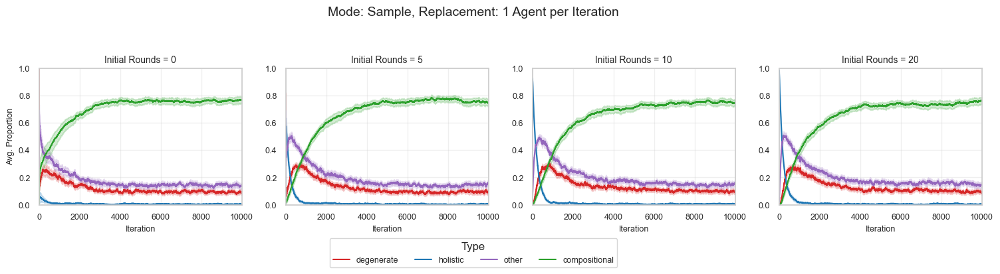

In [ ]:

for replace in replaces:
    for mode in modes:
        csv_path = f"Experiment_9/plots/{mode}/{replace}/{mode}"
        df = pd.read_csv(f"{csv_path}.csv")
        save_path = f"Experiment_9/plots/{mode}/{replace}/grid"
        plot_grid_holistic(df, save_path, mode, replace)

### Experiment 6

In [88]:
modes = ["MAP", "Sample"]
replaces = [True, False]
strengths = [0.0, 0.25, 0.5, 0.75, 1.0]
n_runs = 50

In [ ]:
for mode in modes:
    for replace in replaces:
        list_df = []
        for strength in strengths:
            for run in range(n_runs):
                df = pd.read_csv(f"Experiment_6/results_snellius/{mode}/{replace}/{strength}/run{run}.csv")
                df["condition"] = strength
                list_df.append(df)

        save_dir = f"Experiment_6/plots/{mode}/{replace}"
        os.makedirs(save_dir, exist_ok=True)  
        big_df = pd.concat(list_df)
        big_df.to_csv(f"{save_dir}/{mode}.csv")


In [103]:
def fast_plot_weaker_prior(csv_path1, csv_path2, title, save_path):
    # Load both CSVs
    df1 = pd.read_csv(f"{csv_path1}.csv")
    df2 = pd.read_csv(f"{csv_path2}.csv")

    def compute_summary(df):
        grouped = df.groupby(['condition', 'generation'])['compositional']
        mean = grouped.mean()
        sem = grouped.sem()
        ci_hi = mean + 1.96 * sem
        ci_lo = mean - 1.96 * sem
        return pd.DataFrame({'mean': mean, 'ci_lo': ci_lo, 'ci_hi': ci_hi}).reset_index()

    summary1 = compute_summary(df1)
    summary2 = compute_summary(df2)

    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

    
    def plot_summary(ax, summary, title, labelyaxis):
        pops = sorted(summary['condition'].unique())
        colors = plt.cm.viridis(np.linspace(0, 1, len(pops)))
        
        for i, pop in enumerate(summary['condition'].unique()):
            pop_data = summary[summary['condition'] == pop]
            ax.plot(pop_data['generation'], pop_data['mean'], color=colors[i], label=f'{pop}')
            ax.fill_between(pop_data['generation'], pop_data['ci_lo'], pop_data['ci_hi'], color=colors[i], alpha=0.05, rasterized=True)

            if pop_data.empty:
                continue
            final_gen = pop_data['generation'].max()
            final_row = pop_data[pop_data['generation'] == final_gen]
            if not final_row.empty:
                mean_val = final_row['mean'].values[0]
                ci_lo_val = final_row['ci_lo'].values[0]
                ci_hi_val = final_row['ci_hi'].values[0]
                print(f"  {pop}: {mean_val:.3f} (95% CI: {ci_lo_val:.3f} – {ci_hi_val:.3f})")
                
        if labelyaxis:
            ax.set_ylabel('Proportion compositional')
        else:
            ax.set_ylabel("")  # remove y-axis title
    
        ax.grid(True)
        ax.set_title(title)
        ax.set_xlabel('Iteration')
        ax.set_ylabel('Proportion compositional')
        ax.tick_params(labelleft=True)

    # Plot both
    plot_summary(ax1, summary1, "All agents replaced per generation", True)
    print("\n")
    plot_summary(ax2, summary2, "One agent replaced per generation", False)

    # Shared legend below
    handles, labels = ax1.get_legend_handles_labels()
    fig.legend(handles, labels, title='Strength of Compressibility Prior', loc='lower center', ncol=len(labels))
    fig.suptitle(title, fontsize=20)

    ax1.set_xlim(summary1['generation'].min(), summary1['generation'].max())
    ax2.set_xlim(summary2['generation'].min(), summary2['generation'].max())

    # Layout cleanup
    fig.tight_layout(rect=[0, 0.05, 1, 0.95])  # Minimized bottom space
    plt.savefig(f"{save_path}.pdf", bbox_inches='tight', pad_inches=0.05)
    plt.show()

  0.0: 0.297 (95% CI: 0.272 – 0.323)
  0.25: 0.573 (95% CI: 0.549 – 0.597)
  0.5: 0.758 (95% CI: 0.735 – 0.782)
  0.75: 0.817 (95% CI: 0.795 – 0.839)
  1.0: 0.767 (95% CI: 0.744 – 0.790)


  0.0: 0.267 (95% CI: 0.240 – 0.294)
  0.25: 0.602 (95% CI: 0.577 – 0.628)
  0.5: 0.753 (95% CI: 0.732 – 0.773)
  0.75: 0.822 (95% CI: 0.804 – 0.841)
  1.0: 0.767 (95% CI: 0.741 – 0.792)


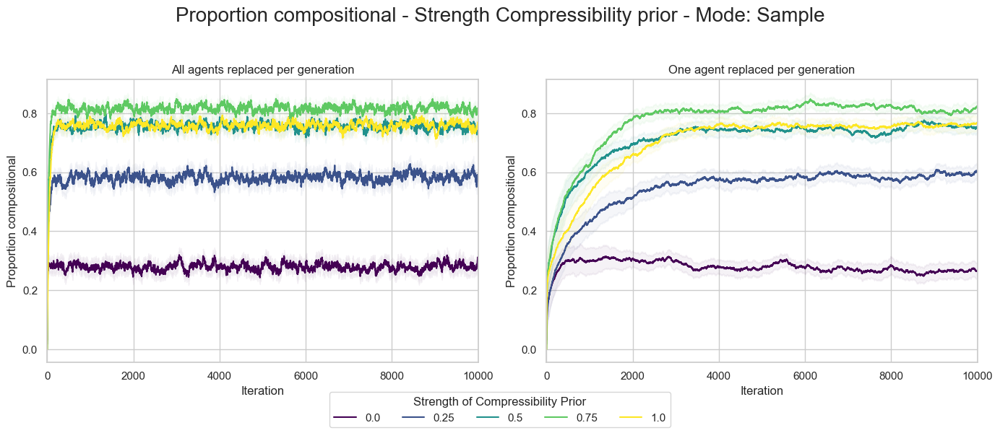

  0.0: 0.259 (95% CI: 0.235 – 0.283)
  0.25: 0.865 (95% CI: 0.849 – 0.882)
  0.5: 0.866 (95% CI: 0.846 – 0.886)
  0.75: 0.858 (95% CI: 0.840 – 0.875)
  1.0: 0.770 (95% CI: 0.748 – 0.792)


  0.0: 0.262 (95% CI: 0.242 – 0.282)
  0.25: 0.852 (95% CI: 0.834 – 0.871)
  0.5: 0.864 (95% CI: 0.845 – 0.884)
  0.75: 0.858 (95% CI: 0.839 – 0.876)
  1.0: 0.753 (95% CI: 0.731 – 0.775)


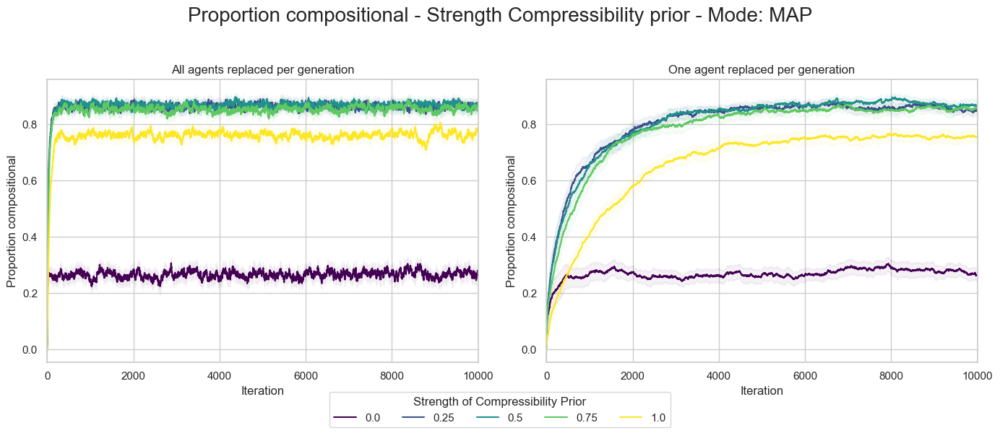

In [ ]:
for mode in modes:
    path1 = f"Experiment_6/plots/{mode}/True/{mode}"
    path2 = f"Experiment_6/plots/{mode}/False/{mode}"

    fast_plot_weaker_prior(path1, path2, f"Proportion compositional - Strength Compressibility prior - Mode: {mode}", f"weaker_prior/plots/{mode}")


In [101]:
def plot_each_language_type_ax(ax, results, title):
    grouped = results.groupby("generation")[["degenerate", "holistic", "other", "compositional"]]
    
    # Compute mean, std, and n
    grouped_mean = grouped.mean()
    grouped_sem = grouped.sem()
    
    # Compute standard error and 95% CI using t-distribution
    ci95 = 1.96 * grouped_sem  

    colors = {
        "degenerate": "#d62728",    # red
        "holistic": "#1f77b4",      # blue
        "other": "#9467bd",         # purple
        "compositional": "#2ca02c"  # green
    }

    for col in grouped_mean.columns:
        mean = grouped_mean[col]
        ci = ci95[col]

        ax.plot(grouped_mean.index, mean, label=col, color=colors[col])
        ax.fill_between(grouped_mean.index, mean - ci, mean + ci, alpha=0.2, color=colors[col], rasterized=True)

    ax.set_ylim(0, 1)
    ax.set_title(title, fontsize=10)
    ax.grid(alpha=0.3)
    ax.tick_params(axis="both", which="both", labelsize=9)


def plot_grid_weaker_prior(big_df, save_to, mode, replace):
    import matplotlib.pyplot as plt

    strengths = [0, 0.25, 0.5, 0.75, 1.0]  # strength compressibility prior

    # Create 2 rows × 3 columns of subplots (6 total, last one for legend)
    fig, axes = plt.subplots(2, 3, figsize=(14, 8))
    axes = axes.flatten()

    for j, r in enumerate(strengths):
        ax = axes[j]
        subset = big_df[big_df["condition"] == r]


        if not subset.empty:
            plot_each_language_type_ax(ax, subset, f"Strength Compressibility Prior {r}")
        else:
            ax.axis("off")

        ax.set_xlabel("Iteration ", fontsize=9)
        if j % 3 == 0:  # first column in each row
            ax.set_ylabel("Avg. Proportion", fontsize=9)
        
        ax.set_xlim(0, 10000)

    # Turn off the last subplot (empty spot for legend)
    legend_ax = axes[-1]
    legend_ax.axis("off")

    # Gather legend handles and place in the empty subplot
    handles, labels = axes[0].get_legend_handles_labels()
    legend_ax.legend(
        handles, labels,
        loc="center",
        ncol=2,
        title="Type",
        fontsize=10,
        frameon=True
    )

    # Title
    replace_str = "Entire Population" if replace else "1 Agent per Iteration"
    fig.suptitle(f"Mode: {mode}, Replacement: {replace_str}", fontsize=14, y=0.98)

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.savefig(f"{save_to}.pdf", bbox_inches="tight", pad_inches=0.05)
    plt.show()


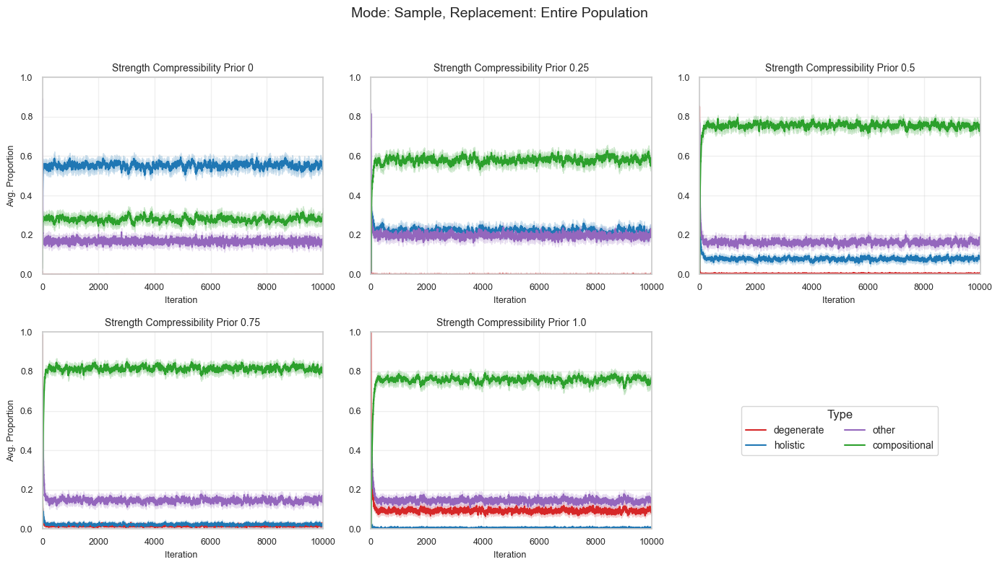

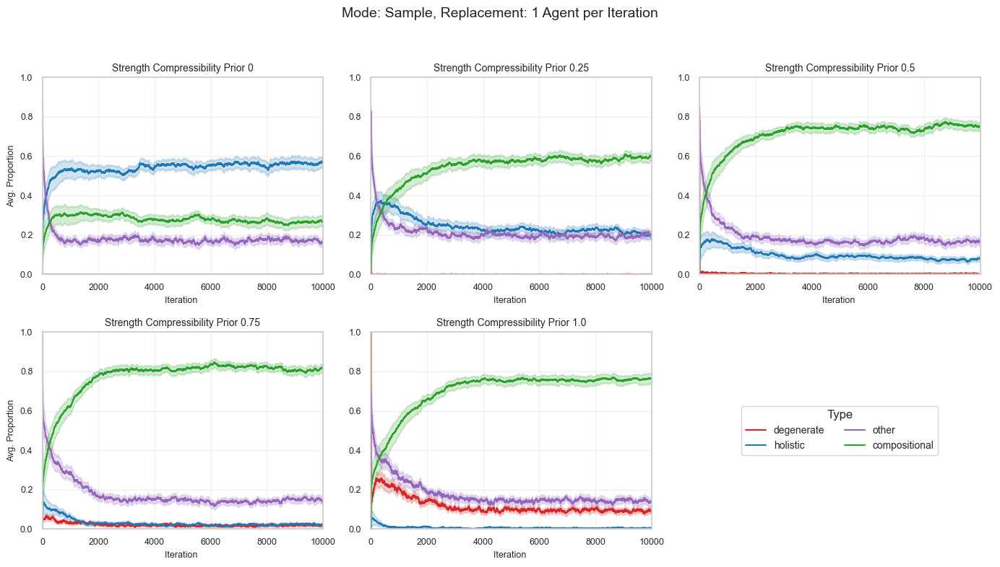

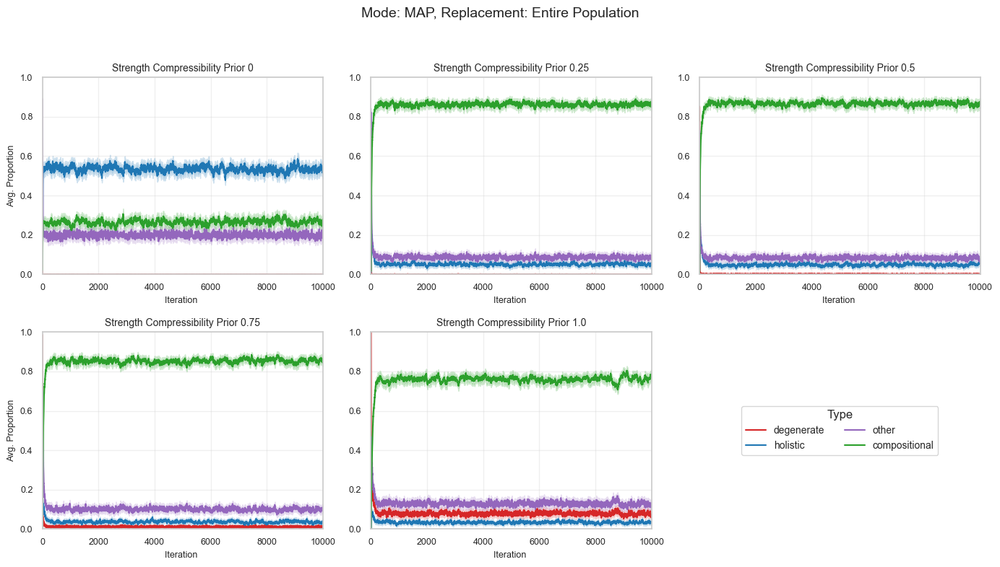

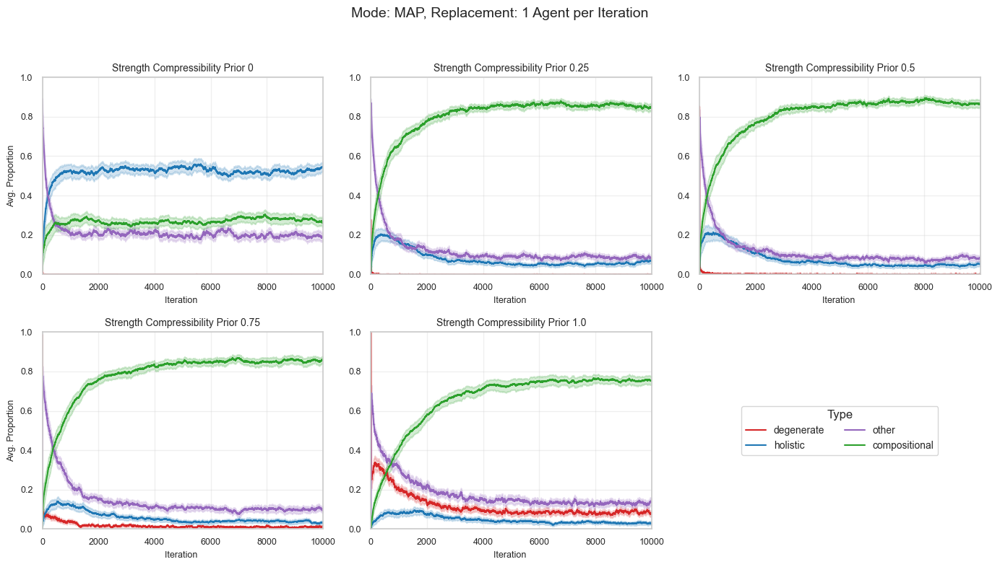

In [ ]:
for mode in modes:
    for replace in replaces:
        csv_path = f"Experiment_6/plots/{mode}/{replace}/{mode}"
        df = pd.read_csv(f"{csv_path}.csv")
        save_path = f"Experiment_6/plots/{mode}/{replace}/grid"
        plot_grid_weaker_prior(df, save_path, mode, replace)

### Experiment 10

In [ ]:
# merging and saving bigger csv files....
h_trans = [20]
v_trans = [30]
pop_sizes = [25]
modes = ["Sample", "MAP"]
networks = ["fully-connected"]
dynamic = [False]
replaced = [True, False]
betas = [0.0, 0.25, 0.5, 0.75, 1.0]
alpha = [0.0, 0.00025, 0.0005, 0.00075, 0.001]

for mode in modes:
    for replace in replaced:
        list_df = []
        for a in alpha:
            for b in betas:
                for pop_size in pop_sizes:
                    name = f"h20_v30_p25"
                    if b == 0:
                        b = 0.0
                    results_dir = f"Experiment_10/results_snellius_extra/{mode}/{replace}/{a}/{b}/{name}"
                    for run in range(n_runs):
                        df = pd.read_csv(f"{results_dir}/run{run}.csv")
                        df["condition"] = f"{a}, {b}"
                        list_df.append(df)

        save_dir = f"Experiment_10/plots/{mode}/{replace}"
        os.makedirs(save_dir, exist_ok=True)  
        big_df = pd.concat(list_df)
        big_df.to_csv(f"{save_dir}/{mode}.csv")

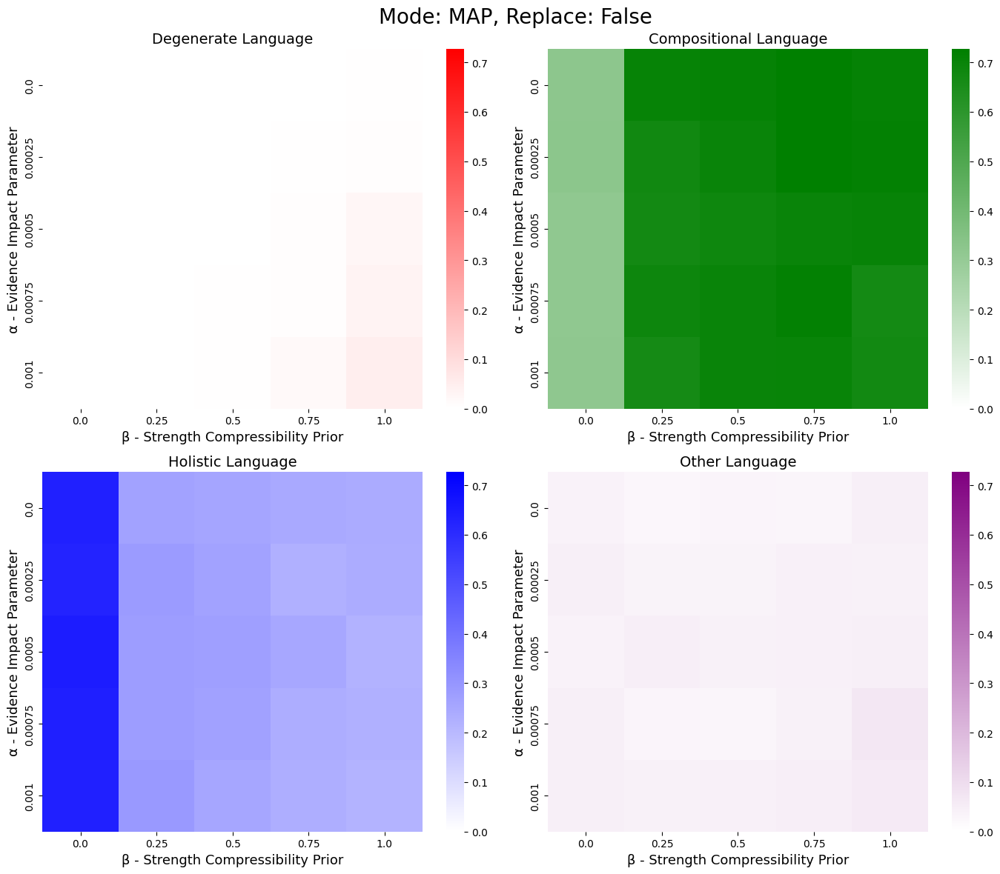

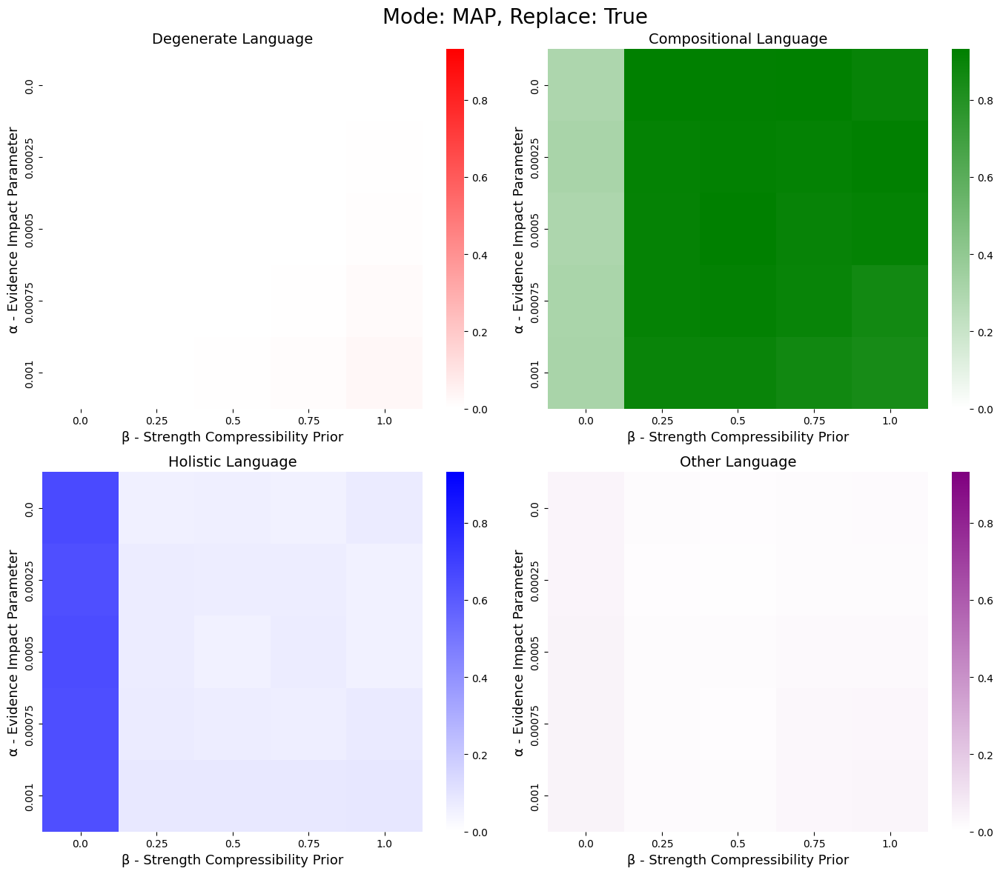

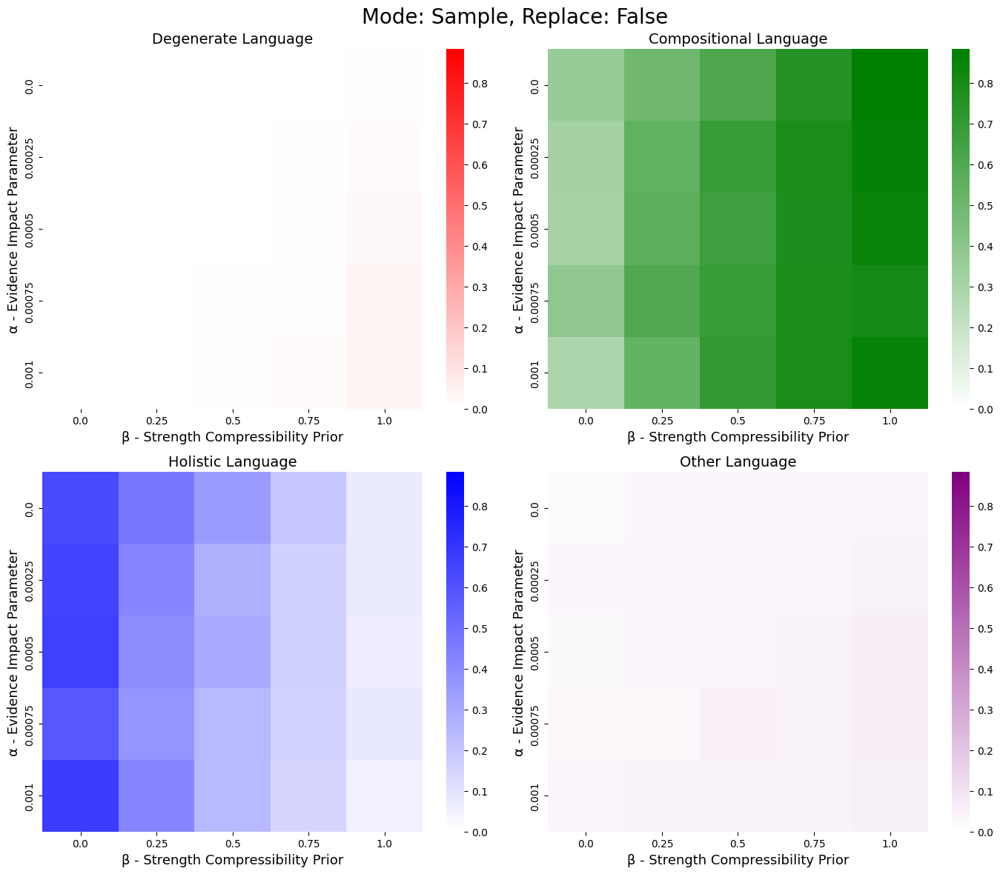

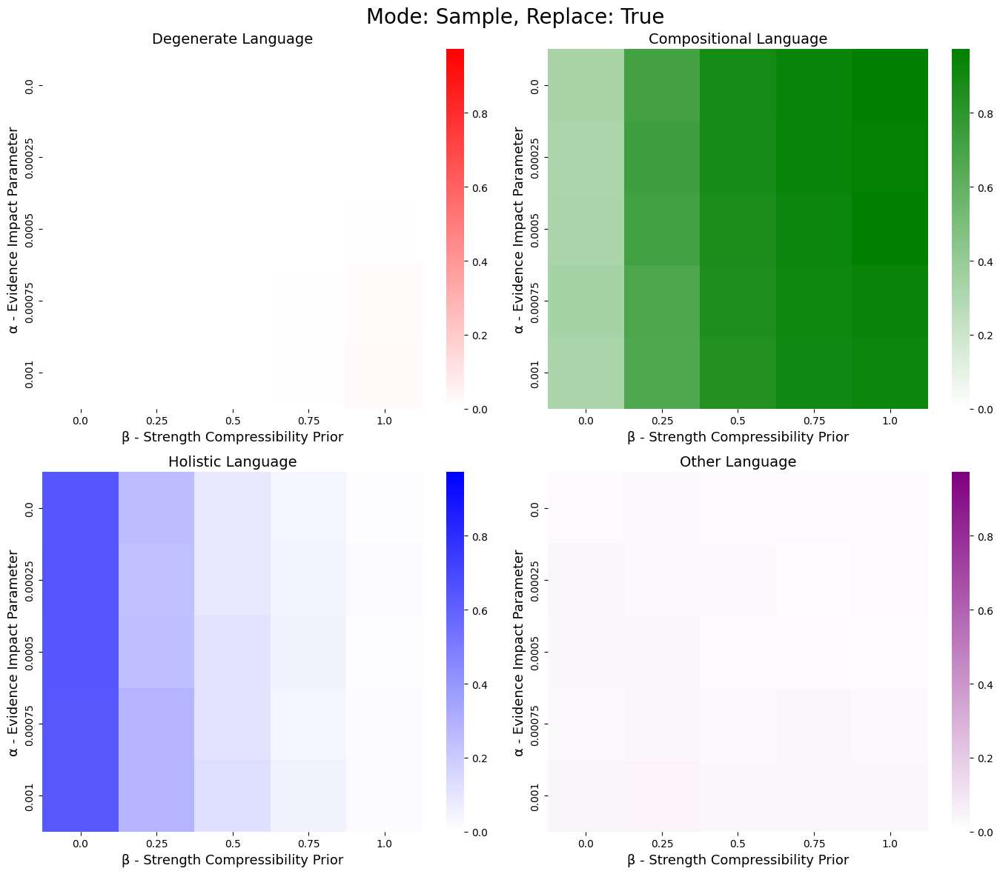

In [ ]:
for mode in modes:
    for replace in replaced:
        df = pd.read_csv(f"Experiment_10/plots/{mode}/{replace}/{mode}.csv")
        df = df[df["generation"] == 5000]

        # Split 'condition' into numeric alpha and beta
        df[['alpha', 'beta']] = df['condition'].str.split(',', expand=True).astype(float)

        # Convert the language-type columns to numeric (coerce errors -> NaN)
        language_types = ['degenerate', 'compositional', 'holistic', 'other']
        df[language_types] = df[language_types].apply(pd.to_numeric, errors='coerce')

        # Drop rows where all language-type values are NaN
        df = df.dropna(subset=language_types, how='all')

        # Average across duplicate (alpha, beta) pairs
        df_mean = df.groupby(['alpha', 'beta'])[language_types].mean().reset_index()

        # Define custom color maps
        color_maps = {
            'degenerate': LinearSegmentedColormap.from_list('degenerate', ['white', 'red']),
            'compositional': LinearSegmentedColormap.from_list('compositional', ['white', 'green']),
            'holistic': LinearSegmentedColormap.from_list('holistic', ['white', 'blue']),
            'other': LinearSegmentedColormap.from_list('other', ['white', 'purple'])
        }

        # Shared color scale across all maps
        vmin = df_mean[language_types].min().min()
        vmax = df_mean[language_types].max().max()

        # Sort for tidy axis ordering
        df_mean = df_mean.sort_values(['alpha', 'beta'])

        # Create figure
        fig, axes = plt.subplots(2, 2, figsize=(14, 12))
        fig.suptitle(f"Mode: {mode}, Replace: {replace}", fontsize=20)
        axes = axes.flatten()

        # Plot each language type
        for i, lang in enumerate(language_types):
            # Pivot to matrix form
            heatmap_data = df_mean.pivot(index='alpha', columns='beta', values=lang)

            sns.heatmap(
                heatmap_data,
                ax=axes[i],
                cmap=color_maps[lang],
                vmin=vmin, vmax=vmax,
                cbar=True
            )
            axes[i].set_title(f"{lang.capitalize()} Language", fontsize=14)
            axes[i].set_xlabel('β - Strength Compressibility Prior', fontsize=13)
            axes[i].set_ylabel('α - Evidence Impact Parameter', fontsize=13)

        plt.tight_layout()
        plt.savefig(f"Experiment_10/plots/{mode}/{replace}/{mode}.pdf", bbox_inches="tight", pad_inches=0.05)
        plt.show()


### Experiment 7

In [97]:
group_rounds = [20]
turnover_rounds = [20]
pop_sizes = [2, 10, 25, 50, 100, 200]
n_runs = 50
modes = ["Sample", "MAP"]
replaced = [False, True]

In [ ]:
for mode in modes:
    for replace in replaced:
        list_df = []
        missing_runs = []

        for group_round in group_rounds:
            for turnover_round in turnover_rounds:
                for pop_size in pop_sizes:
                    path = f"Experiment_7/results_snellius/{mode}/{replace}/0.0/h{group_round}_v{turnover_round}_p{pop_size}"
                    
                    for run in range(n_runs):
                        filepath = f"{path}/run{run}.csv"

                        if not os.path.exists(filepath):
                            print(f"Missing file: {filepath}")
                            missing_runs.append(filepath)
                            continue  # skip this run

                        try:
                            df = pd.read_csv(filepath)
                            df["group_round"] = group_round
                            df["turnover_round"] = turnover_round
                            df["pop_size"] = pop_size
                            df["replace"] = replace
                            df["mode"] = mode
                            list_df.append(df)
                        except Exception as e:
                            print(f"Error reading {filepath}: {e}")
                            missing_runs.append(filepath)
                            continue

        save_dir = f"Experiment_7/plots/{mode}/{turnover_round}/{replace}"
        os.makedirs(save_dir, exist_ok=True)

        # Save combined dataframe if not empty
        if list_df:
            big_df = pd.concat(list_df, ignore_index=True)
            big_df.to_csv(f"{save_dir}/{mode}.csv", index=False)
            print(f"Saved {save_dir}/{mode}.csv ({len(big_df)} rows)")
        else:
            print(f"No data found for mode={mode}, replace={replace}")

        # Write missing runs to text file
        if missing_runs:
            with open(f"{save_dir}/missing_runs.txt", "w") as f:
                for filepath in missing_runs:
                    f.write(filepath + "\n")
            print(f"Missing runs logged in {save_dir}/missing_runs.txt")


  2: 0.700 (95% CI: 0.612 – 0.787)
  10: 0.723 (95% CI: 0.685 – 0.762)
  25: 0.735 (95% CI: 0.707 – 0.763)
  50: 0.717 (95% CI: 0.699 – 0.735)
  100: 0.731 (95% CI: 0.717 – 0.745)
  200: 0.716 (95% CI: 0.706 – 0.726)
  2: 0.765 (95% CI: 0.681 – 0.849)
  10: 0.718 (95% CI: 0.683 – 0.754)
  25: 0.720 (95% CI: 0.702 – 0.739)
  50: 0.722 (95% CI: 0.704 – 0.741)
  100: 0.701 (95% CI: 0.688 – 0.713)
  200: 0.605 (95% CI: 0.588 – 0.622)


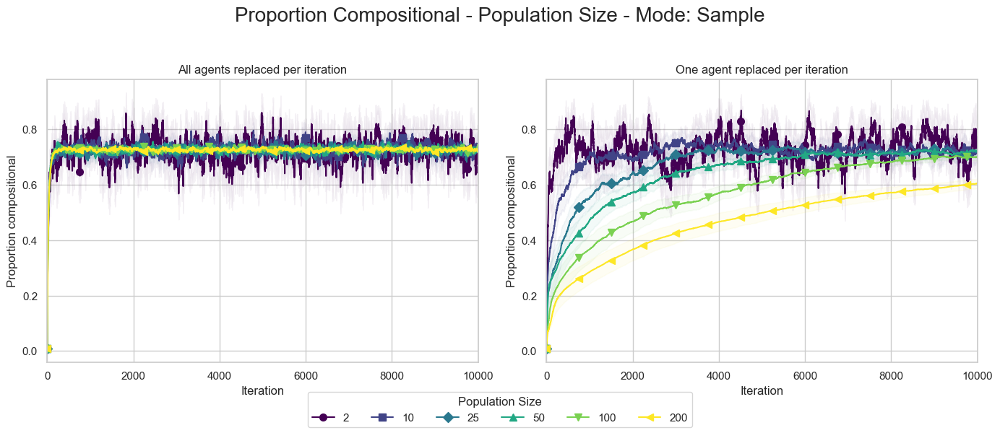

  2: 0.904 (95% CI: 0.851 – 0.958)
  10: 0.872 (95% CI: 0.841 – 0.904)
  25: 0.859 (95% CI: 0.839 – 0.880)
  50: 0.863 (95% CI: 0.849 – 0.876)
  100: 0.858 (95% CI: 0.849 – 0.867)
  200: 0.855 (95% CI: 0.848 – 0.862)
  2: 0.885 (95% CI: 0.815 – 0.955)
  10: 0.858 (95% CI: 0.831 – 0.886)
  25: 0.871 (95% CI: 0.852 – 0.891)
  50: 0.850 (95% CI: 0.835 – 0.865)
  100: 0.804 (95% CI: 0.793 – 0.815)
  200: 0.699 (95% CI: 0.685 – 0.713)


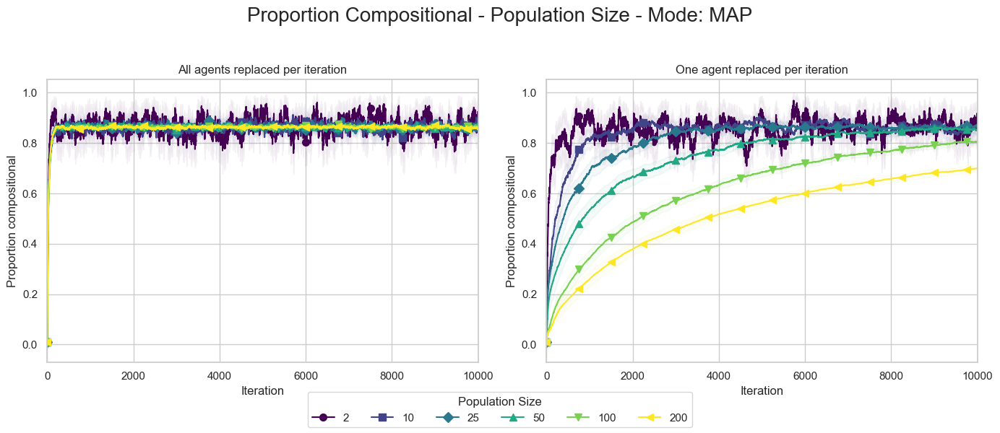

In [ ]:
for mode in modes:
    save_dir1 = f"Experiment_7/plots/{mode}/20/True"
    save_dir2 = f"Experiment_7/plots/{mode}/20/False"
        
    csv_path1 = f"{save_dir1}/{mode}"
    csv_path2 = f"{save_dir2}/{mode}"
    
    fast_plot_ex2(csv_path1, csv_path2, f"Proportion Compositional - Population Size - Mode: {mode}", 
                  f"Experiment_7/plots/{mode}/{mode}_20")

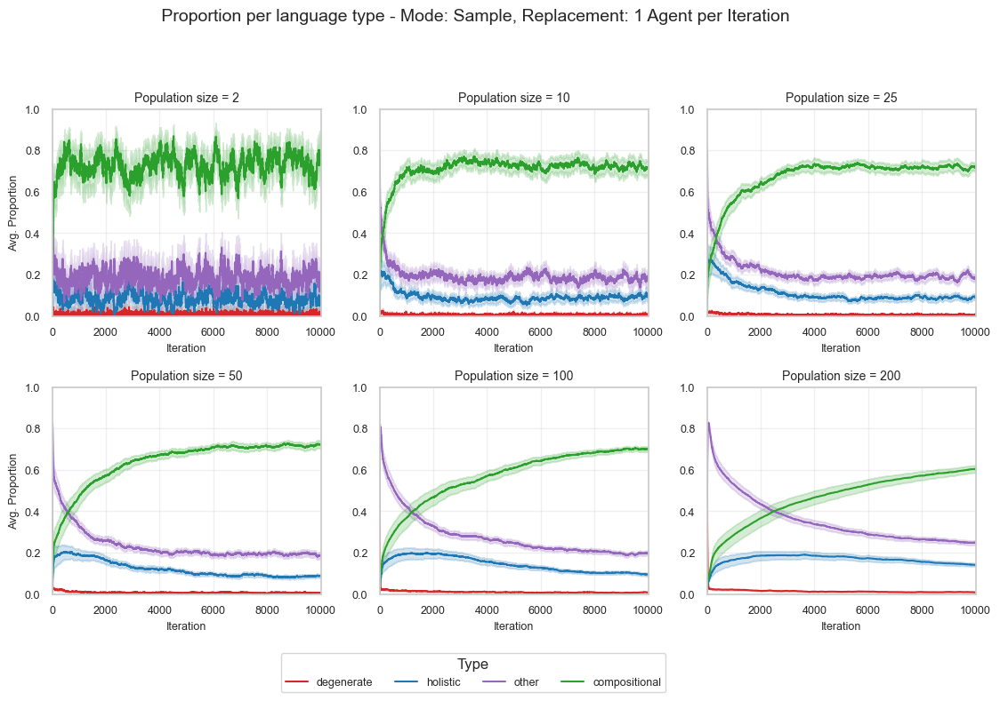

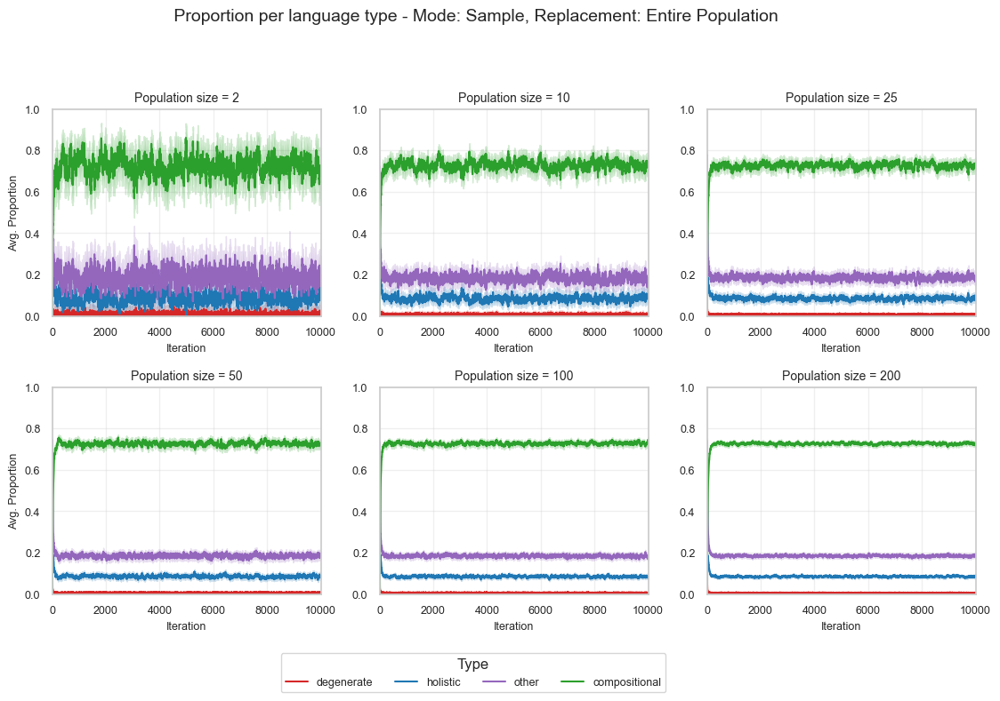

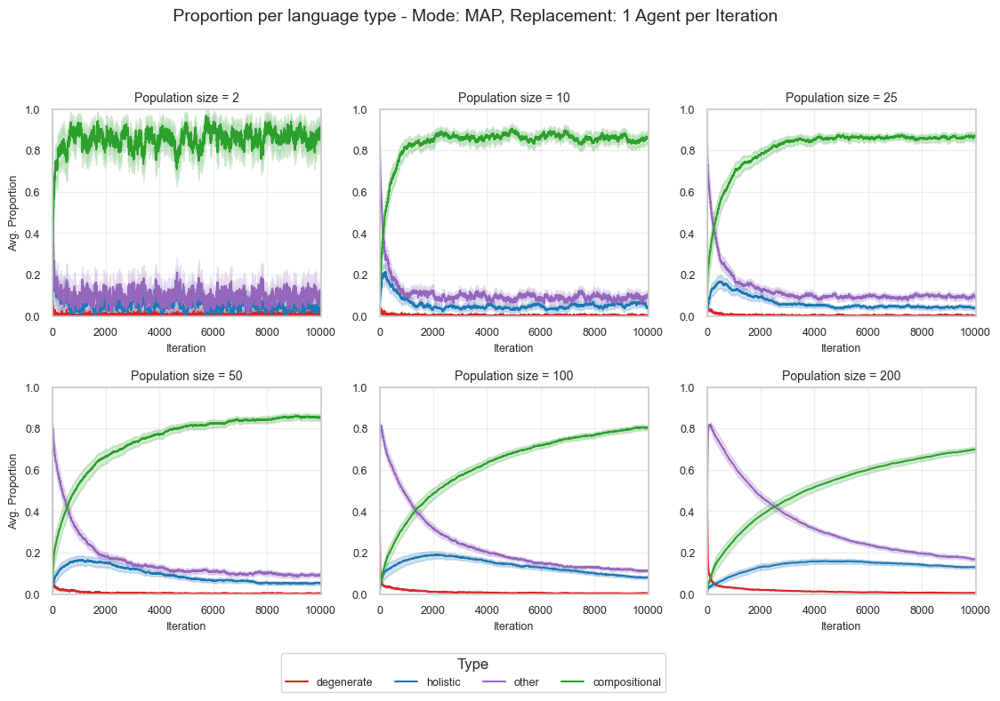

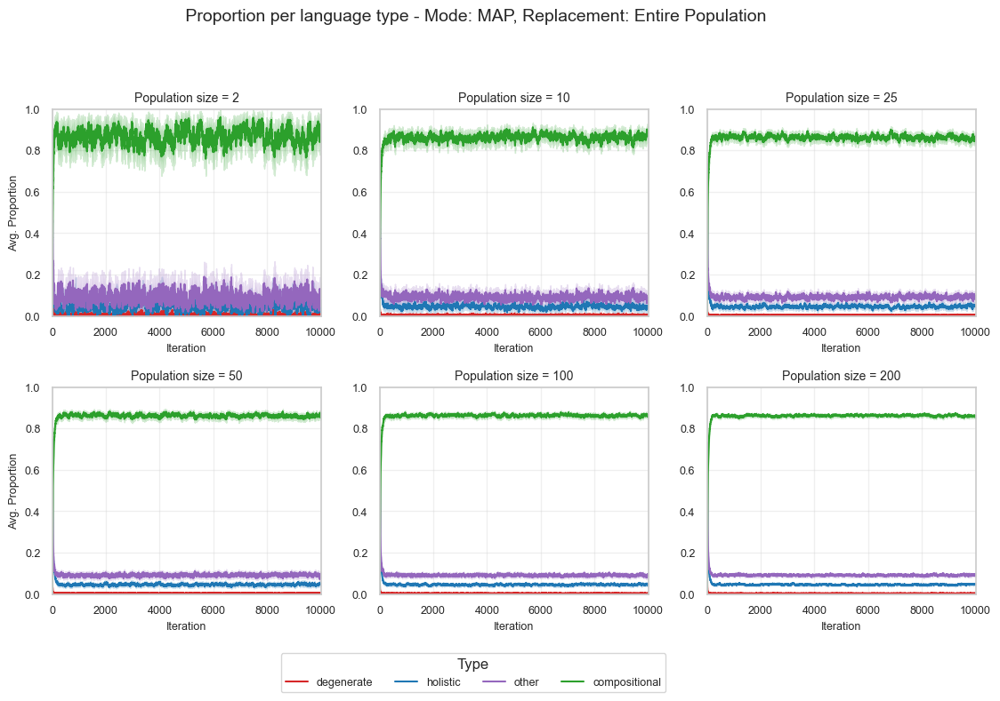

In [ ]:
for mode in modes:
    for replace in replaced:
        name = f"Experiment_7/plots/{mode}/20/{replace}/{mode}"
        df = pd.read_csv(f"{name}.csv")
        plot_grid_popsize(df, f"{name}_{replace}", mode, replace)